<a href="https://colab.research.google.com/github/vrmusketeers/DeepLearningProject/blob/main/notebooks/Train_VAE_and_DALLE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install packages

In [1]:
!pip install dalle-pytorch --upgrade
!pip install wandb

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### API - f20852b77d3e12d57881037f40cdbd17df9850ac

In [ ]:
# import wandb
# !wandb login
!wandb login f20852b77d3e12d57881037f40cdbd17df9850ac

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
!pip install pytorch-lightning==1.9.0

In [ ]:
!pip install dalle-pytorch --upgrade

In [ ]:
from random import choice
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from math import sqrt
import zipfile
import gc

import torch
from torch.nn.utils import clip_grad_norm_
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau, ExponentialLR

from PIL import Image
from torchvision import transforms as T
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder

In [ ]:
from dalle_pytorch import distributed_utils
from dalle_pytorch import OpenAIDiscreteVAE, DiscreteVAE, DALLE
from dalle_pytorch import VQGanVAE
from dalle_pytorch.tokenizer import tokenizer

# Load data: CubiCasa Floorplans

In [ ]:
with zipfile.ZipFile('/content/drive/MyDrive/truncated_dataset.zip', 'r') as zip_ref:
  zip_ref.extractall('/')

# Train Variational Autoencoder (VAE)

In [ ]:
!mkdir -p /content/model/vae-checkpoint

## Set hyperparameters

In [ ]:
import os

path = "/content/truncated_dataset"
if os.path.exists(path):
    print("Path exists")
else:
    print("Path does not exist")


Path exists


In [ ]:
# import os

# # Paths
# input_folder = "/content/organized_dataset"
# output_folder = "/content/truncated_dataset"

# # Ensure output folder exists
# os.makedirs(output_folder, exist_ok=True)

# # Traverse the folders and files in the input folder
# for subfolder in os.listdir(input_folder):
#     subfolder_path = os.path.join(input_folder, subfolder)
#     if os.path.isdir(subfolder_path):
#         # Create corresponding subfolder in output folder
#         output_subfolder_path = os.path.join(output_folder, subfolder)
#         os.makedirs(output_subfolder_path, exist_ok=True)

#         for file_name in os.listdir(subfolder_path):
#             file_path = os.path.join(subfolder_path, file_name)

#             # Check if it's a text file
#             if file_name.endswith(".txt"):
#                 # Read and truncate text
#                 with open(file_path, "r") as file:
#                     text = file.read()
#                     truncated_text = text[:265]  # Truncate to 265 characters

#                 # Save truncated text in the output folder
#                 output_file_path = os.path.join(output_subfolder_path, file_name)
#                 with open(output_file_path, "w") as file:
#                     file.write(truncated_text)

#             # Copy image files as they are
#             elif file_name.endswith(".png"):
#                 output_image_path = os.path.join(output_subfolder_path, file_name)
#                 with open(file_path, "rb") as src, open(output_image_path, "wb") as dst:
#                     dst.write(src.read())

# print("Truncated dataset saved in:", output_folder)

In [ ]:
class Arguments:
  def __init__(self):
    self.WANDB_OWNER = 'gauravpatel779-national-institute-of-technology-tiruchir'
    # self.TEXT_IMAGE_PATH = '/content/drive/MyDrive/CMPE 258 Deep Learning/annotated_cubicasa/1-Floors'
    self.TEXT_IMAGE_PATH = '/content/truncated_dataset'
    self.IMAGE_SIZE = 128
    self.deepspeed = False
    self.distributed_backend = None

    self.TEST_SET_SIZE = 0.1
    self.TEXT_SEQ_LEN = 256
    self.resize_ratio = 0.9

    self.distr_backend = distributed_utils.set_backend_from_args(self)
    self.distr_backend.initialize()
    self.using_deepspeed = distributed_utils.using_backend(distributed_utils.DeepSpeedBackend)

In [ ]:
class VaeArguments(Arguments):
  def __init__(self):
    super(VaeArguments, self).__init__()
    self.EPOCHS = 10
    self.BATCH_SIZE = 6
    self.LEARNING_RATE = 1e-3
    self.LR_DECAY_RATE = 0.98

    self.NUM_TOKENS = 8192
    self.NUM_LAYERS = 3
    self.NUM_RESNET_BLOCKS = 2
    self.SMOOTH_L1_LOSS = False
    self.EMB_DIM = 512
    self.HID_DIM = 256
    self.KL_LOSS_WEIGHT = 0

    self.STARTING_TEMP = 1.
    self.TEMP_MIN = 0.5
    self.ANNEAL_RATE = 1e-6

    self.NUM_IMAGES_SAVE = 2
    self.WANDB_PROJ_NAME = 'cubicasa-vae'


args = VaeArguments()
attrs = vars(args)
print('\n'.join("%s: %s" % item for item in attrs.items()))

WANDB_OWNER: gauravpatel779-national-institute-of-technology-tiruchir
TEXT_IMAGE_PATH: /content/truncated_dataset
IMAGE_SIZE: 128
deepspeed: False
distributed_backend: None
TEST_SET_SIZE: 0.1
TEXT_SEQ_LEN: 256
resize_ratio: 0.9
distr_backend: <dalle_pytorch.distributed_backends.dummy_backend.DummyBackend object at 0x7ac3c2841150>
using_deepspeed: False
EPOCHS: 10
BATCH_SIZE: 6
LEARNING_RATE: 0.001
LR_DECAY_RATE: 0.98
NUM_TOKENS: 8192
NUM_LAYERS: 3
NUM_RESNET_BLOCKS: 2
SMOOTH_L1_LOSS: False
EMB_DIM: 512
HID_DIM: 256
KL_LOSS_WEIGHT: 0
STARTING_TEMP: 1.0
TEMP_MIN: 0.5
ANNEAL_RATE: 1e-06
NUM_IMAGES_SAVE: 2
WANDB_PROJ_NAME: cubicasa-vae


## Create dataset of (text, image) pairs

In [ ]:
# Create Dataset

class TextImageDataset(Dataset):
    def __init__(self, folder, text_len = 256, image_size = 128):
        super().__init__()
        path = Path(folder)

        text_files = [*path.glob('**/*.txt')]

        image_files = [
            *path.glob('**/*.png'),
            *path.glob('**/*.jpg'),
            *path.glob('**/*.jpeg'),
            *path.glob('**/*.bmp')
        ]

        text_files = {t.stem: t for t in text_files}
        image_files = {i.stem: i for i in image_files}

        keys = (image_files.keys() & text_files.keys())

        self.keys = list(keys)
        self.text_files = {k: v for k, v in text_files.items() if k in keys}
        self.image_files = {k: v for k, v in image_files.items() if k in keys}
        self.text_len = text_len

        self.image_tranform = T.Compose([
            T.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),
            T.Resize(args.IMAGE_SIZE),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.keys)

    def __getitem__(self, ind):
        key = self.keys[ind]
        text_file = self.text_files[key]
        image_file = self.image_files[key]

        image = Image.open(image_file)
        descriptions = text_file.read_text().split('\n')
        descriptions = list(filter(lambda t: len(t) > 0, descriptions))
        description = choice(descriptions)

        tokenized_text = tokenizer.tokenize(description, self.text_len).squeeze(0)

        image_tensor = self.image_tranform(image)
        return tokenized_text, image_tensor

In [ ]:
ds = TextImageDataset(
    args.TEXT_IMAGE_PATH,
    text_len = args.TEXT_SEQ_LEN,
    image_size = args.IMAGE_SIZE
)

In [ ]:
# Train/test split
assert len(ds) > 0, 'dataset is empty'
if args.distr_backend.is_root_worker():
    print(f'{len(ds)} image-text pairs found for training')

train_size = int((1 - args.TEST_SET_SIZE) * len(ds))
test_size = len(ds) - train_size
if args.distr_backend.is_root_worker():
    print(f'{train_size} training / {test_size} validation')

# Setup DataLoader
train_dataset, val_dataset = torch.utils.data.random_split(ds, [train_size, test_size])

if distributed_utils.using_backend(distributed_utils.HorovodBackend):
    data_sampler = torch.utils.data.distributed.DistributedSampler(
        ds, num_replicas=args.distr_backend.get_world_size(),
        rank=args.distr_backend.get_rank())
else:
    data_sampler = None

dl = DataLoader(train_dataset, args.BATCH_SIZE, shuffle=not data_sampler, sampler=data_sampler)
val_dl = DataLoader(val_dataset, args.BATCH_SIZE, shuffle=not data_sampler, sampler=data_sampler)

4003 image-text pairs found for training
3602 training / 401 validation


In [ ]:
def save_vae_model(path):
    if not args.distr_backend.is_root_worker():
        return

    save_obj = {
        'hparams': vae_params,
        'weights': vae.state_dict()
    }

    torch.save(save_obj, path)

def save_dalle_model(path):
    if not args.distr_backend.is_root_worker():
        return

    save_obj = {
        'hparams': dalle_params,
        'vae_params': vae_params,
        'weights': dalle.state_dict()
    }

    torch.save(save_obj, path)

## Train
* Optimizer: Adam
* Activation Functions: ReLU

In [ ]:
# Setup VAE params for training
vae_params = dict(
    image_size = args.IMAGE_SIZE,
    num_layers = args.NUM_LAYERS,
    num_tokens = args.NUM_TOKENS,
    codebook_dim = args.EMB_DIM,
    hidden_dim   = args.HID_DIM,
    num_resnet_blocks = args.NUM_RESNET_BLOCKS,
    smooth_l1_loss = args.SMOOTH_L1_LOSS,
    kl_div_loss_weight = args.KL_LOSS_WEIGHT
)

In [ ]:
# Init wandb experiment run
if args.distr_backend.is_root_worker():
    import wandb

    run = wandb.init(
        entity=args.WANDB_OWNER,
        project = args.WANDB_PROJ_NAME,
        job_type = 'train_model',
        config = vae_params,
        mode="offline"
    )

In [ ]:
from torchvision.utils import make_grid

In [ ]:
# Init DiscreteVAE
vae = DiscreteVAE(**vae_params)
if torch.cuda.is_available():
  vae = vae.cuda()

# Setup Adam optimizer
opt = Adam(vae.parameters(), lr=args.LEARNING_RATE)
args.distr_backend.check_batch_size(args.BATCH_SIZE)
deepspeed_config = {'train_batch_size': args.BATCH_SIZE}

(distr_vae, distr_opt, distr_dl, distr_sched) = args.distr_backend.distribute(
    args=args,
    model=vae,
    optimizer=opt,
    model_parameters=vae.parameters(),
    training_data=train_dataset if args.using_deepspeed else dl,
    config_params=deepspeed_config,
)

# Init extra starting args
global_step = 0
temp = args.STARTING_TEMP

In [ ]:
# Define training loop over mini-batches
torch.cuda.empty_cache()
for epoch in range(args.EPOCHS):
    for i, (text, images) in enumerate(distr_dl):
        if torch.cuda.is_available():
          images = images.cuda()

        # Compute losses from image batch
        loss, recons = distr_vae(
            images,
            return_loss = True,
            return_recons = True,
            temp = temp
        )

        # Adjust network parameters from losses
        if args.using_deepspeed:
            distr_vae.backward(loss)
            distr_vae.step()
        else:
            distr_opt.zero_grad()
            loss.backward()
            distr_opt.step()

        # Log sample images and metrics to wandb and save model checkpoints
        logs = {}

        if i % 30 == 0:
            if args.distr_backend.is_root_worker():
                k = args.NUM_IMAGES_SAVE

                with torch.no_grad():
                    codes = vae.get_codebook_indices(images[:k])
                    hard_recons = vae.decode(codes)

                images, recons = map(lambda t: t[:k], (images, recons))
                images, recons, hard_recons, codes = map(lambda t: t.detach().cpu(), (images, recons, hard_recons, codes))
                images = make_grid(images.float(), nrow = int(sqrt(k)), normalize = False, value_range  = (-1, 1))
                recons, hard_recons = map(lambda t: make_grid(t.float(), nrow = int(sqrt(k)), normalize = True, value_range  = (-1, 1)), (recons, hard_recons))

                logs = {
                    **logs,
                    'sample images':        wandb.Image(images, caption = 'original images'),
                    'reconstructions':      wandb.Image(recons, caption = 'reconstructions'),
                    'hard reconstructions': wandb.Image(hard_recons, caption = 'hard reconstructions'),
                    'codebook_indices':     wandb.Histogram(codes),
                    'temperature':          temp
                }

                save_vae_model('./model/vae-checkpoint/vae-epoch-{}.pt'.format(epoch))
                wandb.save('./model/vae-checkpoint/vae-epoch-{}.pt'.format(epoch))

            temp = max(temp * math.exp(-args.ANNEAL_RATE * global_step), args.TEMP_MIN)

        # Collective loss, averaged
        avg_loss = args.distr_backend.average_all(loss)

        if args.distr_backend.is_root_worker():
            if i % 10 == 0:
                print(f'Epoch: {epoch}', f'i: {i}', f'lr: {args.LEARNING_RATE:6f} loss: {avg_loss.item()}')

                logs = {
                    **logs,
                    'epoch': epoch,
                    'iter': i,
                    'loss': avg_loss.item(),
                }

            wandb.log(logs)
        global_step += 1

    # Validation step
    for val_batch_idx, (val_text, val_images) in enumerate(val_dl):
        if torch.cuda.is_available():
          val_images = val_images.cuda()

        loss, recons = distr_vae(
            val_images,
            return_loss = True,
            return_recons = True,
            temp = temp
        )

        if not args.using_deepspeed:
            distr_opt.zero_grad()

        avg_loss = args.distr_backend.average_all(loss)

        if args.distr_backend.is_root_worker():
            if val_batch_idx % 10 == 0:
                print(f'Epoch: {epoch}', f'Val batch idx: {val_batch_idx}', f'val_loss: {avg_loss.item()}')

                logs = {
                    'val_epoch': epoch,
                    'val_iter': val_batch_idx,
                    'val_loss': avg_loss.item(),
                }

                wandb.log(logs)

    # Save model checkpoint at every epoch
    if args.distr_backend.is_root_worker():
        model_artifact = wandb.Artifact('trained-vae', type = 'model', metadata = dict(vae_params))
        model_artifact.add_file('./model/vae-checkpoint/vae-epoch-{}.pt'.format(epoch))
        run.log_artifact(model_artifact)

Epoch: 0 i: 0 lr: 0.001000 loss: 0.8755998611450195
Epoch: 0 i: 10 lr: 0.001000 loss: 0.3068678081035614
Epoch: 0 i: 20 lr: 0.001000 loss: 0.28973522782325745
Epoch: 0 i: 30 lr: 0.001000 loss: 0.18350480496883392
Epoch: 0 i: 40 lr: 0.001000 loss: 0.16198699176311493
Epoch: 0 i: 50 lr: 0.001000 loss: 0.15361769497394562
Epoch: 0 i: 60 lr: 0.001000 loss: 0.11591413617134094
Epoch: 0 i: 70 lr: 0.001000 loss: 0.09203752130270004
Epoch: 0 i: 80 lr: 0.001000 loss: 0.08356652408838272
Epoch: 0 i: 90 lr: 0.001000 loss: 0.07325810194015503
Epoch: 0 i: 100 lr: 0.001000 loss: 0.07959898561239243
Epoch: 0 i: 110 lr: 0.001000 loss: 0.07107017189264297
Epoch: 0 i: 120 lr: 0.001000 loss: 0.07016629725694656
Epoch: 0 i: 130 lr: 0.001000 loss: 0.0632195845246315
Epoch: 0 i: 140 lr: 0.001000 loss: 0.05544526129961014
Epoch: 0 i: 150 lr: 0.001000 loss: 0.050307027995586395
Epoch: 0 i: 160 lr: 0.001000 loss: 0.04953892156481743
Epoch: 0 i: 170 lr: 0.001000 loss: 0.043658528476953506
Epoch: 0 i: 180 lr: 0.

In [ ]:
# Save final model after training completes and end the wandb run
if args.distr_backend.is_root_worker():
    save_vae_model('./vae-final.pt')
    wandb.save('./vae-final.pt')

    model_artifact = wandb.Artifact('trained-vae', type = 'model', metadata = dict(vae_params))
    model_artifact.add_file('vae-final.pt')
    run.log_artifact(model_artifact)

    wandb.finish()

epoch,▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇███████
iter,▄▇▁▂▄▇▇██▁▅▆▆▆▇▅▆▁▃▄▇▂▅▅▆▄▆▁▃▃▆▇▇▁▁▂▄▆▆█
loss,▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▇▇▆█▇▇███
temperature,█████████▇▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁
val_epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇██
val_iter,▁▂▅▆▇▁▇█▁▂▅▇█▂▃▆▇█▂▃▇▁▂▃▅█▃▆▇█▃▅▇█▂▇▁▂▃▇
val_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▇███▇▇▆█▇▇▇▇
epoch,9
iter,600
loss,0.15481
temperature,0.5353


In [ ]:
!mkdir -p '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae/'

In [ ]:
# lists the files in the directory
!ls '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae'

In [ ]:
!cp '/content/model/vae-checkpoint/vae-epoch-5.pt' '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae/2024-11-23.pt'

# Train DALL-E

In [ ]:
!mkdir -p /content/model/dalle-checkpoint

In [ ]:
# Clear GPU caches and garbage collec to clear some memory
gc.collect()
torch.cuda.empty_cache()

## Define utils

In [ ]:
# Checks if path exists or not
def exists(val):
    return val is not None

#
def group_weight(model):
    group_decay, group_no_decay = [], []
    for params in model.named_parameters():
        if 'transformer' in params[0]:
            if 'bias' in params[0] or 'norm' in params[0]:
                group_no_decay.append(params[1])
                continue
        group_decay.append(params[1])

    assert len(list(model.parameters())) == len(group_decay) + len(group_no_decay)
    groups = [dict(params=group_decay), dict(params=group_no_decay, weight_decay=.0)]
    return groups

## Set hyperparameters

In [ ]:
class DalleArguments(Arguments):
  def __init__(self):
    super(DalleArguments, self).__init__()
    # Load VAE from previously trained VAE saved in our Google Drive
    # self.VAE_PATH = '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae/2024-11-23.pt'
    self.VAE_PATH = '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae/2024-11-23.pt'
    self.DALLE_PATH = None
    self.RESUME = exists(self.DALLE_PATH)
    self.taming = True
    self.fp16 = False

    self.EPOCHS = 10
    self.BATCH_SIZE = 4
    self.LEARNING_RATE = 1e-3
    self.GRAD_CLIP_NORM = 0.5

    self.MODEL_DIM = 512
    self.DEPTH = 2
    self.HEADS = 4
    self.DIM_HEAD = 64
    self.REVERSIBLE = True
    self.LOSS_IMG_WEIGHT = 7
    self.LR_DECAY = False

    self.WANDB_PROJ_NAME = 'cubicasa-dalle'

args = DalleArguments()
attrs = vars(args)
print('\n'.join("%s: %s" % item for item in attrs.items()))

WANDB_OWNER: gauravpatel779-national-institute-of-technology-tiruchir
TEXT_IMAGE_PATH: /content/truncated_dataset
IMAGE_SIZE: 128
deepspeed: False
distributed_backend: None
TEST_SET_SIZE: 0.1
TEXT_SEQ_LEN: 256
resize_ratio: 0.9
distr_backend: <dalle_pytorch.distributed_backends.dummy_backend.DummyBackend object at 0x7ac3c2841150>
using_deepspeed: False
VAE_PATH: /content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/vae/2024-11-23.pt
DALLE_PATH: None
RESUME: False
taming: True
fp16: False
EPOCHS: 10
BATCH_SIZE: 4
LEARNING_RATE: 0.001
GRAD_CLIP_NORM: 0.5
MODEL_DIM: 512
DEPTH: 2
HEADS: 4
DIM_HEAD: 64
REVERSIBLE: True
LOSS_IMG_WEIGHT: 7
LR_DECAY: False
WANDB_PROJ_NAME: cubicasa-dalle


## Load VAE

In [ ]:
# Load or setup VAE depending if model artifact exists

# If the model exists and we want to resume training, load it into DiscreteVAE
# and continue training it
if args.RESUME:
    dalle_path = Path(args.DALLE_PATH)
    assert dalle_path.exists(), 'DALL-E model does not exist'

    loaded_obj = torch.load(str(dalle_path), map_location='cpu')

    dalle_params, vae_params, weights = loaded_obj['hparams'], loaded_obj['vae_params'], loaded_obj['weights']

    if vae_params is not None:
        vae = DiscreteVAE(**vae_params)
    else:
        vae_klass = OpenAIDiscreteVAE if not taming else VQGanVAE
        vae = vae_klass()

    dalle_params = dict(
        **dalle_params
    )
    IMAGE_SIZE = vae.image_size
else:
    # If the VAE model exists, load it into DiscreteVAE for DALLE
    if exists(args.VAE_PATH):
        vae_path = Path(args.VAE_PATH)
        assert vae_path.exists(), 'VAE model file does not exist'

        loaded_obj = torch.load(str(vae_path))

        vae_params, weights = loaded_obj['hparams'], loaded_obj['weights']

        vae = DiscreteVAE(**vae_params)
        vae.load_state_dict(weights)
    else:
        # If the custom trained VAE doesn't exist, use a pretrained VAE released
        # by OpenAI
        if distr_backend.is_root_worker():
            print('using pretrained VAE for encoding images to tokens')
        vae_params = None

        vae_klass = OpenAIDiscreteVAE if not taming else VQGanVAE
        vae = vae_klass()

    IMAGE_SIZE = vae.image_size

    # Setup DALL-E params
    dalle_params = dict(
        num_text_tokens = tokenizer.vocab_size,
        text_seq_len = args.TEXT_SEQ_LEN,
        dim = args.MODEL_DIM,
        depth = args.DEPTH,
        heads = args.HEADS,
        dim_head = args.DIM_HEAD,
        reversible = args.REVERSIBLE,
        loss_img_weight = args.LOSS_IMG_WEIGHT
    )

<ipython-input-42-479a0971ba57>:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_obj = torch.load(str(vae_path))


In [ ]:
# Configure OpenAI VAE for float16s
if isinstance(vae, OpenAIDiscreteVAE) and args.fp16:
    vae.enc.blocks.output.conv.use_float16 = True

# Initialize DALL-E
dalle = DALLE(vae=vae, **dalle_params)
if args.fp16:
    dalle = dalle.half()
dalle = dalle.cuda()

if args.RESUME:
    dalle.load_state_dict(weights)

## Train
* Optimizer: Adam

In [ ]:
# Setup Adam optimizer
opt = Adam(dalle.parameters(), lr=args.LEARNING_RATE)

# Setup optional LR decay scheduler
if args.LR_DECAY:
    scheduler = ReduceLROnPlateau(
        opt,
        mode = "min",
        factor = 0.5,
        patience = 10,
        cooldown = 10,
        min_lr = 1e-6,
        verbose = True,
    )

# Start wandb job
if args.distr_backend.is_root_worker():
    import wandb

    run = wandb.init(
        entity=args.WANDB_OWNER,
        project = args.WANDB_PROJ_NAME,
        resume = args.RESUME,
        config = dalle_params,
    )

args.distr_backend.check_batch_size(args.BATCH_SIZE)
deepspeed_config = {
    'train_batch_size': args.BATCH_SIZE,
    'gradient_clipping': args.GRAD_CLIP_NORM,
    'fp16': {
        'enabled': args.fp16,
    },
}

(distr_dalle, opt, dl, scheduler) = args.distr_backend.distribute(
    # args=args,
    model=dalle,
    optimizer=opt,
    model_parameters=dalle.parameters(),
    training_data=train_ds if args.using_deepspeed else dl,
    lr_scheduler=scheduler if args.LR_DECAY else None,
    config_params=deepspeed_config,
)
avoid_model_calls = args.using_deepspeed and args.fp16

# Setup training loop
torch.cuda.empty_cache()
for epoch in range(args.EPOCHS):
    model_path = './model/dalle-checkpoint/dalle-epoch-{}.pt'.format(epoch)

    # Train in mini-batches
    for i, (text, images) in enumerate(dl):
        if args.fp16:
            images = images.half()
        text, images = map(lambda t: t.cuda(), (text, images))

        # Get loss from (text, images) from DALL-E
        loss = distr_dalle(text, images, return_loss = True)

        # Update network weights from losses
        if args.using_deepspeed:
            distr_dalle.backward(loss)
            distr_dalle.step()
        else:
            loss.backward()
            clip_grad_norm_(distr_dalle.parameters(), args.GRAD_CLIP_NORM)
            opt.step()
            opt.zero_grad()

        # Get average loss
        avg_loss = args.distr_backend.average_all(loss)

        # Log samples and metrics to wandb
        if args.distr_backend.is_root_worker():
            log = {}

            if i % 10 == 0:
                print(f'Epoch: {epoch}', f'i: {i}', f'loss: {avg_loss.item()}')

                log = {
                    **log,
                    'epoch': epoch,
                    'iter': i,
                    'loss': avg_loss.item()
                }

            if i % 30 == 0:
                sample_text = text[:1]
                token_list = sample_text.masked_select(sample_text != 0).tolist()
                decoded_text = tokenizer.decode(token_list)

                save_dalle_model(model_path)
                wandb.save(model_path)

                log = {
                    **log,
                }

                image = dalle.generate_images(text[:1], filter_thres = 0.9)
                arr_ = np.squeeze(image[0].permute(1,2,0).cpu())
                print(decoded_text)
                plt.imshow(arr_)
                plt.axis('off')
                plt.show()

                log['image'] = wandb.Image(image, caption = decoded_text)

            wandb.log(log)

    # Update LR based on scheduled decay
    if args.LR_DECAY:
        scheduler.step(loss)

    # Validation step
    for val_batch_idx, (val_text, val_images) in enumerate(val_dl):
        if args.fp16:
            val_images = val_images.half()
        val_text, val_images = map(lambda t: t.cuda(), (val_text, val_images))

        loss = distr_dalle(val_text, val_images, return_loss = True)

        if not args.using_deepspeed:
            opt.zero_grad()

        avg_loss = args.distr_backend.average_all(loss)

        if args.distr_backend.is_root_worker():
            if val_batch_idx % 10 == 0:
                print(f'Epoch: {epoch}', f'val batch idx: {val_batch_idx}', f'val_loss: {avg_loss.item()}')

                logs = {
                    'val_epoch': epoch,
                    'val_iter': val_batch_idx,
                    'val_loss': avg_loss.item()
                }

                wandb.log(logs)

    # Save model as wandb artifact at end of every epoch
    if args.distr_backend.is_root_worker():
        model_artifact = wandb.Artifact('trained-dalle', type = 'model', metadata = dict(dalle_params))
        model_artifact.add_file(model_path)
        run.log_artifact(model_artifact)

In [ ]:
# Save final trained DALL-E model
if args.distr_backend.is_root_worker():
    save_dalle_model(f'./model/dalle-final.pt')
    wandb.save('./model/dalle-final.pt')
    model_artifact = wandb.Artifact('trained-dalle', type = 'model', metadata = dict(dalle_params))
    model_artifact.add_file('./model/dalle-final.pt')
    run.log_artifact(model_artifact)

    wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇█
iter,▃▄▅▆▆▁▂▄▃▄▅▆█▁▂▅▆▆█▄▆█▂▃▄▆▁▂▂▂█▄▆▁▅▅█▂▃▆
loss,█▆▅▄▄▄▃▃▃▃▃▃▄▃▃▃▂▃▃▂▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁
val_epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇██
val_iter,▁▂▃▅▆▁▃▅▆▇▅▆▇█▂▅▇█▁▂▅▆█▁▃▆▂▃▅▁▃▆▇▁▂▅█▁▃█
val_loss,▇▄▇▆▃▂▅▃▄▅▆▃▄▃▃▂▂▂▃▄▄▂▄▃▂▅▅▆▃▄▁▅▅▃▄▆█▆█▅
epoch,9
iter,600
loss,0.27543
val_epoch,9
val_iter,60


In [ ]:
# Save model to Google Drive
path = '/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/dalle'
save_dalle_model(path)

In [ ]:
input_text = 'the balcony is south of the living room . the balcony is on south side of the floor plan . it measures 1 5 x 5 feet . the bathroom is west of the living room and north of the master room . the bathroom is on western side of the floor plan . it measures 1 0 x 1 0 feet.'

For prediction without training, run this

In [ ]:
loaded_obj = torch.load(str('/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubicasa/dalle'), map_location='cpu')
dalle_params, vae_params, weights = loaded_obj['hparams'], loaded_obj['vae_params'], loaded_obj['weights']
vae = DiscreteVAE(**vae_params)
dalle = DALLE(vae=vae, **dalle_params)
dalle.load_state_dict(weights)

<ipython-input-7-973a9dd4a59b>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_obj = torch.load(str('/content/drive/MyDrive/CMPE 258 Deep Learning/DALL-E/model/cubic

<All keys matched successfully>

### `Prediction`

the balcony is south of the living room . the balcony is on south side of the floor plan . it measures 1 5 x 5 feet . the bathroom is west of the living room and north of the master room . the bathroom is on western side of the floor plan . it measures 1 0 x 1 0 feet.


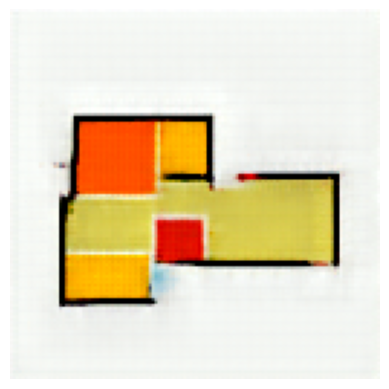

In [ ]:
descriptions = list(filter(lambda t: len(t) > 0, input_text))
text_token = tokenizer.tokenize(descriptions, 256).squeeze(0)
image = dalle.generate_images(text_token[:1], filter_thres = 0.9)

arr_ = np.squeeze(image[0].permute(1,2,0).cpu())
print(input_text)
plt.imshow(arr_)
plt.axis('off')
plt.show()

the balcony lies along the western wall of the living room . it is 5 ft x 1 5 ft . the bathroom is north of the living room and west of the kitchen . it is 6 ft x 1 1 ft . common room # 1 lies north of the living room , along the western wall of the floor plan .


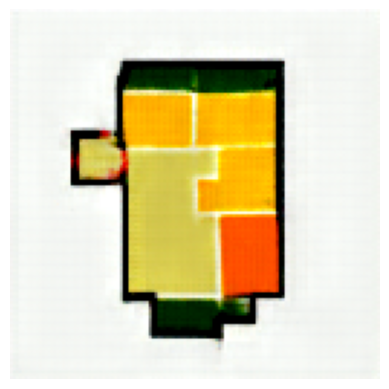

In [ ]:
input_text = 'the balcony lies along the western wall of the living room . it is 5 ft x 1 5 ft . the bathroom is north of the living room and west of the kitchen . it is 6 ft x 1 1 ft . common room # 1 lies north of the living room , along the western wall of the floor plan .'

descriptions = list(filter(lambda t: len(t) > 0, input_text))
text_token = tokenizer.tokenize(descriptions, 256).squeeze(0)
image = dalle.generate_images(text_token[:1], filter_thres = 0.9)

arr_ = np.squeeze(image[0].permute(1,2,0).cpu())
print(input_text)
plt.imshow(arr_)
plt.axis('off')
plt.show()

In [ ]:
with zipfile.ZipFile('/content/drive/MyDrive/test_dataset.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/test_dataset')

In [ ]:
import os

path = "/content/test_dataset"
if os.path.exists(path):
    print("Path exists")
else:
    print("Path does not exist")


Path exists


In [ ]:
output_dir="/content/result"
image_name="generated_image"

In [ ]:
os.makedirs(output_dir, exist_ok=True)

In [ ]:
def generate_images(input_text,folder_name):

  result_dir = os.path.join(output_dir, folder_name)
  os.makedirs(result_dir, exist_ok=True)

  descriptions = list(filter(lambda t: len(t) > 0, input_text))
  text_token = tokenizer.tokenize(descriptions, 256).squeeze(0)
  image = dalle.generate_images(text_token[:1], filter_thres = 0.9)

  image_path = os.path.join(result_dir, f"{folder_name}.png")

  arr_ = np.squeeze(image[0].permute(1,2,0).cpu())
  print(input_text)
  plt.imshow(arr_)
  plt.axis('off')
  plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
  plt.show()


  description_path = os.path.join(result_dir, f"{folder_name}.txt")
  with open(description_path, 'w') as desc_file:
    desc_file.write(input_text)

  print(f"Saved image and description to {output_dir}.")

Processing file: 17003.txt


balcony is in front of bathroom and kitchen it is 15 feet length and 2 feet width ratio as 8 over 2. bathroom 1is front as living room .common room 1 and master room between the room is bathroom 1 .2 feet length and 2 feet width ratio as 2 over 1. bathroom is entra


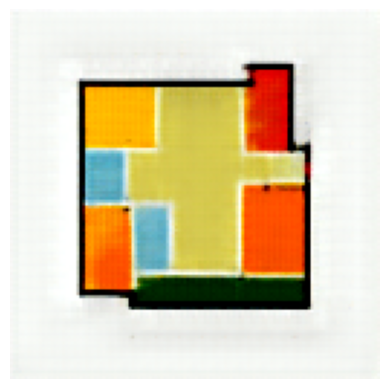

Saved image and description to /content/result.
Processing file: 19968.txt


bathroom is at west direction of home at right side of living room size 10*10 feet common room 1 at north corner of home and right side of master room  size 12*12 feet common room2 is at south east corner of home left side of kitchen size 15*10 feet kitchen is at r


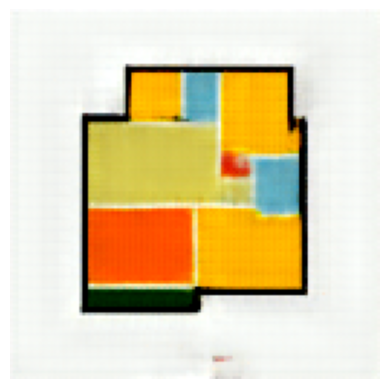

Saved image and description to /content/result.
Processing file: 50658.txt


The balcony is at the South  corner position. near living room. it is 10x6 sq ft. The bathroom is at the North  middle position . between common room1 and kitchen and living room. it is 10x6 sq ft. Common room 1 is at the North and west corner position. between mas


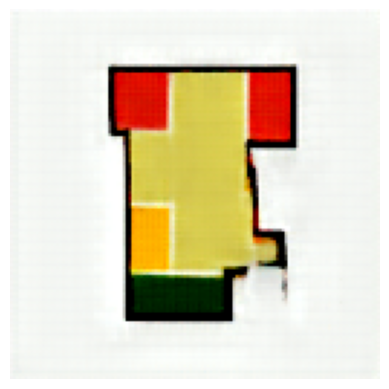

Saved image and description to /content/result.
Processing file: 56692.txt


The balcony is located in the south western corner. Situated between the master bedroom. It is around 50 sqrt feet being 10 feet wide and 5 feet in length which means it has an aspect ratio of 2:1 The bathroom is located in the western corner. Situated between the


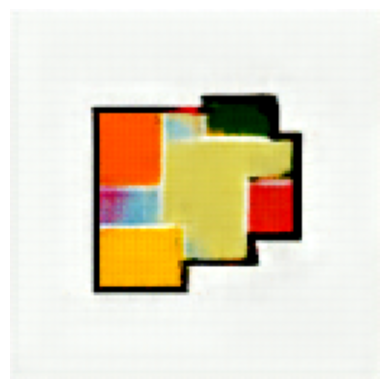

Saved image and description to /content/result.
Processing file: 50217.txt


Bathroom 1 is connected to the master bedroom northwards of it. It is bordering on the east wall. It's measurements are 10x10 square feet. Bathroom 2 is in the very north west corner bordering the kitchen on the east side of it. It's measurements  are 5x5 square fe


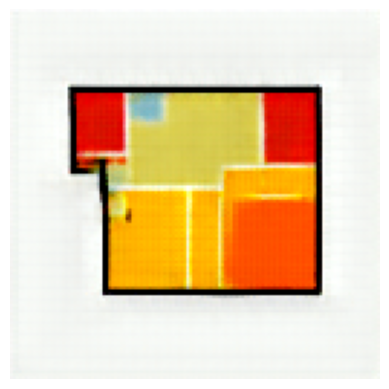

Saved image and description to /content/result.
Processing file: 73187.txt


The balcony is on the north side of the house. To the south is the master, and house exterior to the west, north, and east. It is about 16 feet wide by 4 feet long. The bathroom is on the east side of the house.  It is situated in the northeast corner of the living


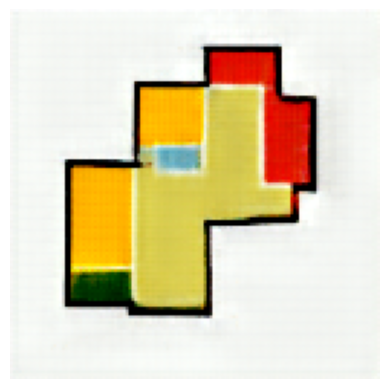

Saved image and description to /content/result.
Processing file: 63632.txt


balcony is located at south east corner and in front of the living room. It has the size of 4 feet width and 15 feet length. bathroom  is located north west side and  in between the kitchen and master room. It has the size of 10 feet length and 5 feet width. common


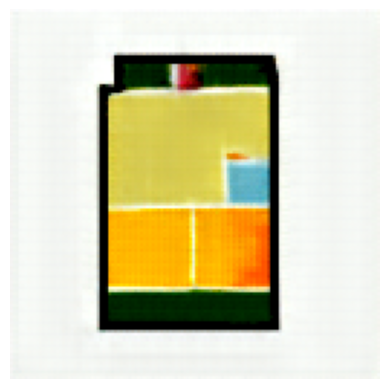

Saved image and description to /content/result.
Processing file: 63342.txt


balcony 1 located in living room and it conected to the living room The approximate size is 4"*6* balcony2 between kitchen and bathroom corner of the house .The approximate size is 4"*9" bathroom alocated by living room top right corner.and its conected with balcon


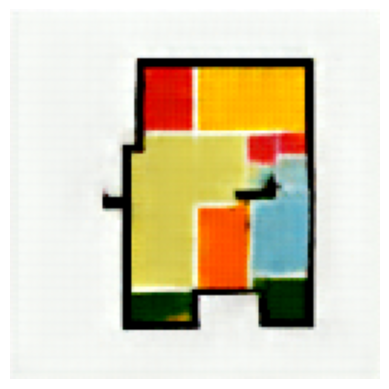

Saved image and description to /content/result.
Processing file: 71192.txt


The small 30 square foot balcony is located off the southside of the living room. On the northside of the house, situated in between the kitchen and the common room, you will find spacious bathroom. The bathroom is a perfect square with 4 10 foot walls. The common


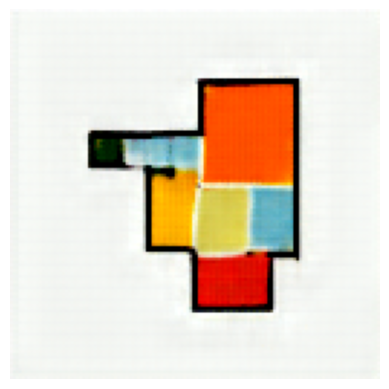

Saved image and description to /content/result.
Processing file: 50068.txt


Bathroom is located on east side of the house between common room 2 and master room. Approximately area of the bathroom was 60-70 sqft in size. Common room 1 is located on the south west corner of the house. Common room 1 is situated between living room and kitchen


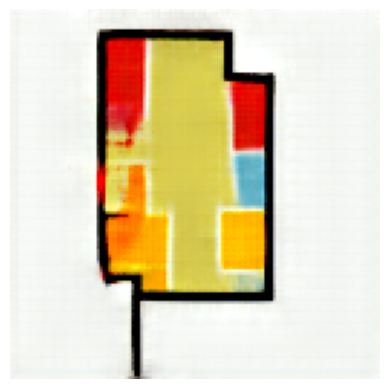

Saved image and description to /content/result.
Processing file: 74152.txt


Balcony is located at south sides. It is located below master room. North and South side lenght is 18 feet. East and west side lenght is 2 feet. Bathroom is located in between kitchen and living room.  North and South side lenght is 8 feet. East and west side lengh


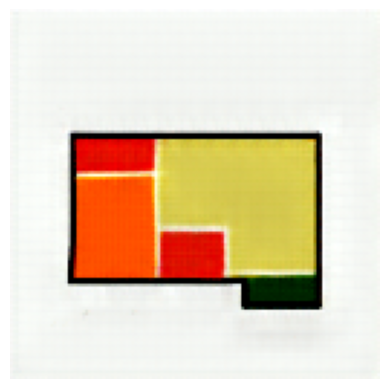

Saved image and description to /content/result.
Processing file: 33233.txt


The balcony is on the east edge of the house, east of the master room. The dimensions are approximately 1X10. The bathroom is on the western side of the house. It sits north of the living room, and south of the common room. The dimensions are approximately 11X4. Th


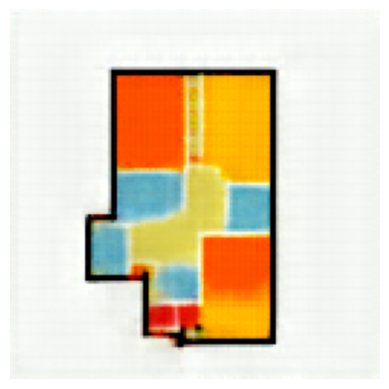

Saved image and description to /content/result.
Processing file: 19792.txt


Bathroom is located in between common room 1 and living room.  North and South side lenght is 8 feet. East and west side lenght is 10 feet. Common room 1 is located in north west corner. North and South side lenght is 12 feet. East and west side lenght is  15 feet


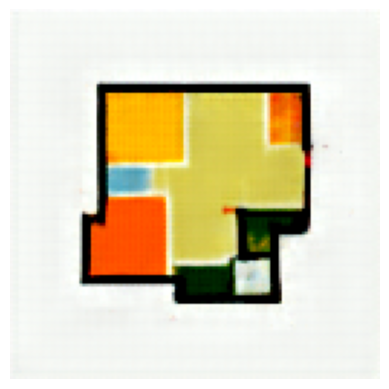

Saved image and description to /content/result.
Processing file: 18986.txt


The bathroom is on the south side of the apartment next to the living room. It is 5â x 5â The common room is on the north east side of the apartment next to the master bedroom. It is 12â x 15' The kitchen is on the south east corner of the apartment next to t


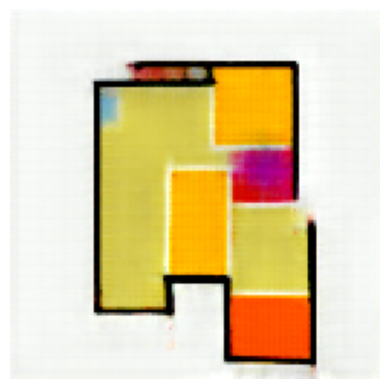

Saved image and description to /content/result.
Processing file: 6754.txt


THE BALCONY IS LOCATED ON SOUTH WEST CORNER.THE BALCONY IS LOCATED NEARBY LIVING HALL.THE FLOOR AREA IS 70 SQUARE FEET. THE BATHROOM IS LOCATED ON EAST SIDE.THE BATHROOM IS LOCATED IN BETWEEN MASTER AND COMMON ROOM.THE FLOOR AREA IS 50 SQUARE FEET. #REF! THE COMMON


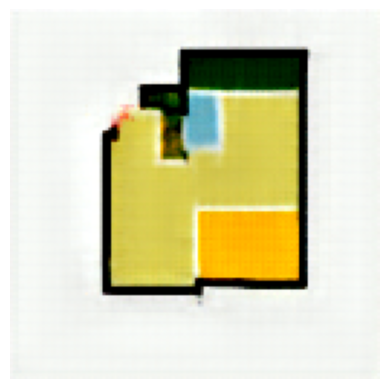

Saved image and description to /content/result.
Processing file: 39406.txt


The balcony is the most west room of the floor plan. It is about 10 feet long ( from north to south) and 3 feet wide (from east to west). Its eastern border is connected to the living room. The bathroom is located in the middle of the floorplan. It is 10 feet long


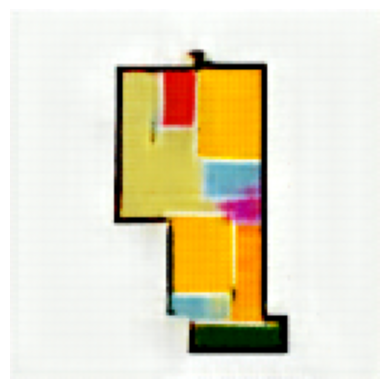

Saved image and description to /content/result.
Processing file: 8024.txt


Walk out balcony approximately 13ft x 4 ft located the rear side the master room. The bath is fully assessable from all other room located with the floor plan approximately 5ft x 5ft. Common room one is designated area located closest to the master room yet assessa


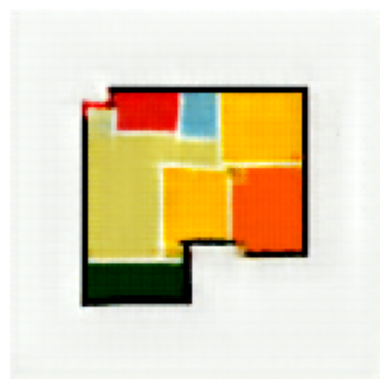

Saved image and description to /content/result.
Processing file: 1522.txt


Balcony in North East corner attached with Common Room. The Balcony size is 10X2. Bath room 1 located in north side near to house entrance. The room size is 8X4. Bath room 2 in East side located in between master room and common room. The room size is 10x3. Common


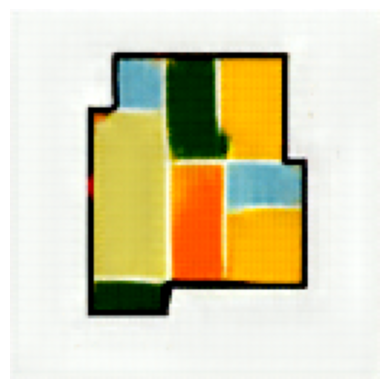

Saved image and description to /content/result.
Processing file: 53393.txt


The bathroom is approximately 30 square feet, located on the north side of the floor plan, and adjacent to the living room and master room. The common room 1 is approximately 120 square feet, located in the southeast corner of the floor plan, and adjacent to the li


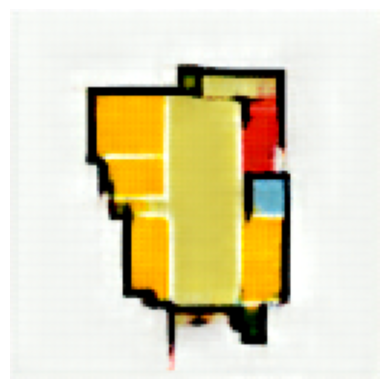

Saved image and description to /content/result.
Processing file: 70742.txt


The balcony is located on the northwest corner and next to living room. size is 20*3 The bathroom is located in the east side and between the master and common room. size is 12*8 The common room is located in the north east corner and next to balcony. size is 18*12


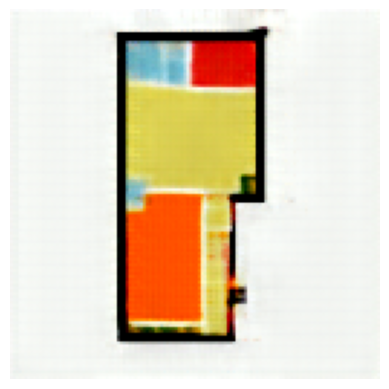

Saved image and description to /content/result.
Processing file: 41482.txt


Bathroom 1 is 10 feet long and 5 feet wide. It is located on the eastern side of the house next to bathroom 2. Bathroom 2 is 10 feet wide and 17 feet long. It is located on the eastern side of the house next to the master bedroom. Common Room 1 is located on the no


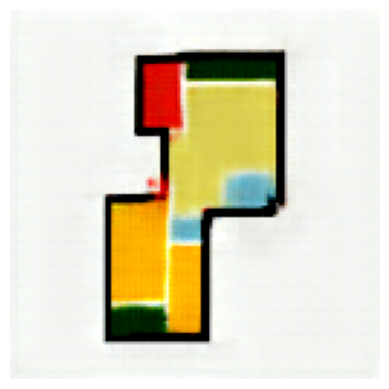

Saved image and description to /content/result.
Processing file: 38526.txt


The balcony is located in the southwest corner side, It is next to living   , The size of the room is  2 feet width  and 10   feet length The bathroom is located in the east side, It is next to living and master, The size of the room is 4 feet width  and 5  feet le


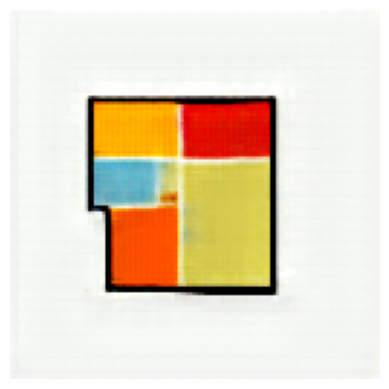

Saved image and description to /content/result.
Processing file: 18788.txt


The balcony bumps out on the south, with living room to the north, has 3 exterior walls, It is approximately 15 feet wide by 8 feet high, giving it a square footage of 120. The bathroom is on the north side with kitchen to the east, and the living room to the south


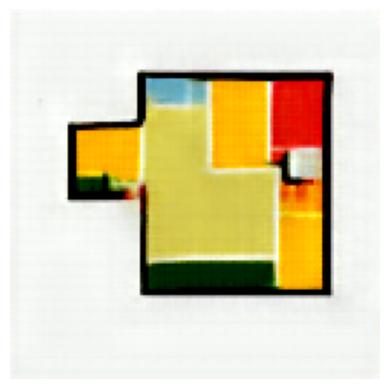

Saved image and description to /content/result.
Processing file: 35066.txt


The balcony is something north side of the apartment next to the living room and it measures 5â x 15â The bathroom is on the west side of the apartment next to the living room and it measures 10â x 5â The first common room is on the west side of the apartme


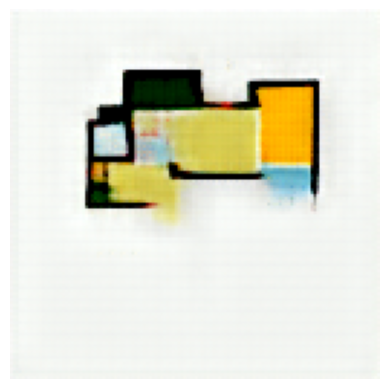

Saved image and description to /content/result.
Processing file: 39012.txt


The balcony is located in the south, right below the living room and common room 1, and measures 18 feet x 5 feet. Bathroom 1, measuring 5ft x 9ft, is on the west side between common room 2 and the master room. Bathroom 2 is in the northeast corner, to the right of


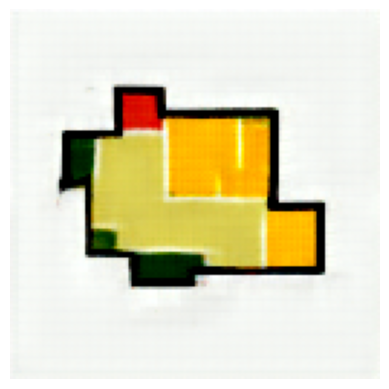

Saved image and description to /content/result.
Processing file: 15030.txt


bathroom is entrance from living room .it is 4 feet length and 3 feet width aspect ratio as 2 over 1.bathroom near room as kitchen. common room is northeast corner room.it is entrance from living room .it is 10 feet length and 10 feet width aspect ratio as 5 over 5


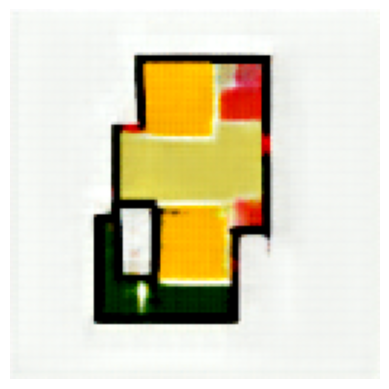

Saved image and description to /content/result.
Processing file: 77964.txt


balcony is is entrance from living room .it is 2 feet length and 10 feet width aspect ratio as 1 over as 3. bathroom is between the common room and master room it is 3 feet length and 3 feet width. bathroom is between common room and master room . common room is no


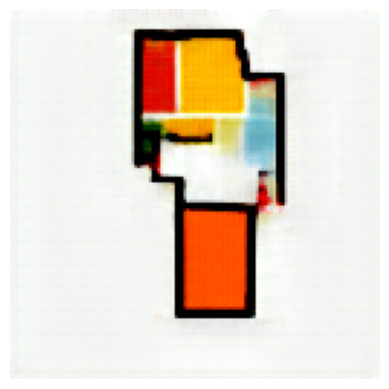

Saved image and description to /content/result.
Processing file: 14238.txt


A balcony is located at the south east corner of the house. This is placed near to common room. And its size is approximately 2x10 feet. A bath room is located at the north side of the house. This is placed near to living room. And its size is approximately 15x5 fe


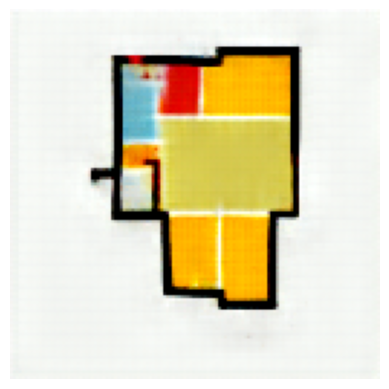

Saved image and description to /content/result.
Processing file: 68112.txt


balcony Room Located on South side of the plan with living Room on above , Total size of 12 Feet length and 2 Feet Width. bath Room Located on North east corner with master Room on below , Total size of 10 Feet length and 4 Feet Width. Common1 Room Located on South


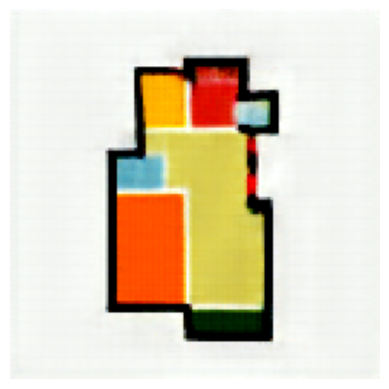

Saved image and description to /content/result.
Processing file: 8989.txt


balcony is the south side it is entrance from living room 10 feet length and 2  feet width ratio as 5 over 1. bath room is the small place compared to other rooms 6 feet length and 4  feet width ratio as 3 over 2. common room is the entrance from living room it is


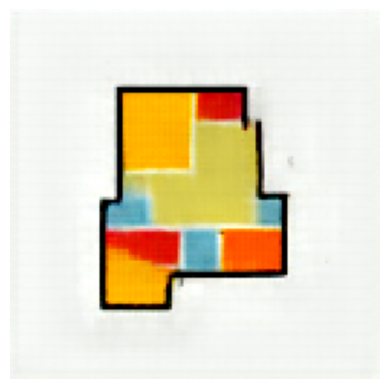

Saved image and description to /content/result.
Processing file: 79854.txt


The balcony is about 2 by 10 feet and is flanked by the kitchen and common room 1 near the front of the floorplan. Bathroom 1 is down the hall off the living room next to the common room 2 and share a wall with bathroom 2. Bathroom 2 is about 40 square feet and is


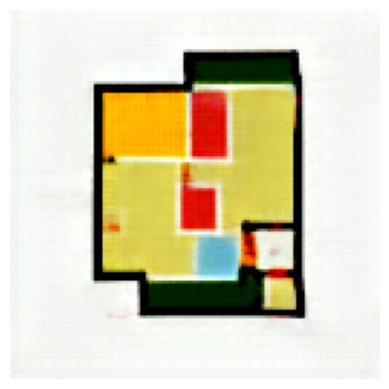

Saved image and description to /content/result.
Processing file: 47623.txt


balcony1: Balcony 1 is on the South side, with the living room to the north, spanning its width, and common room 1 to the west, exterior wall to the east. It is approximately 10 feet wide by 5 feet deep. balcony2: Balcony2 is on the north side, with the kitchen to


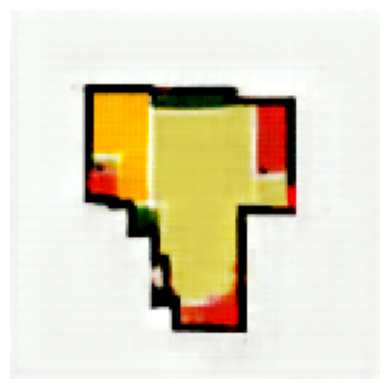

Saved image and description to /content/result.
Processing file: 37648.txt


bathroom is the small place room compared to other rooms it is the entrance from living room 3 feet length and 3 feet width ratio as 1 over 1. common room is the entrance from living room it is the 10 feet length and 20 feet width ratio as 4 over 6. kitchen is the


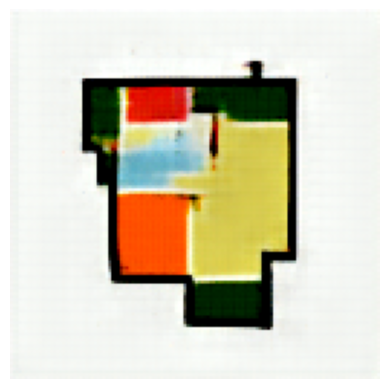

Saved image and description to /content/result.
Processing file: 7953.txt


The balcony is on the south side of the apartment next to the living room and it measures 12â x 5â The bathroom is on the north west corner of the apartment next to the common room and it measures 10â x 5â The common room is on the west side of the apartmen


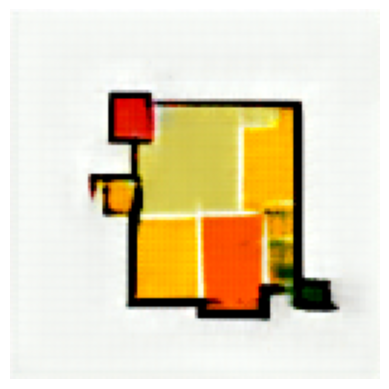

Saved image and description to /content/result.
Processing file: 13511.txt


The balcony was locate in straight of the living room and it's size is 8*2.It is relationship with living room. The bathroom was locate in master room and it's size 4*4.It is relationship with living room and master room. The bathroom was locate in left side of the


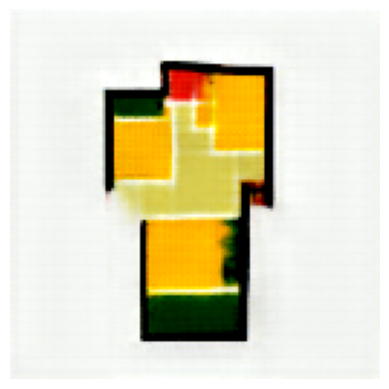

Saved image and description to /content/result.
Processing file: 332.txt
balcony is located at south west corner. It is in front of master room. It has the size of 3 feet width and 12 feet length. bathroom is located at north west side. It is between the kitchen room and master room.  It has the size of 6.5 feet width and 8 feet length.


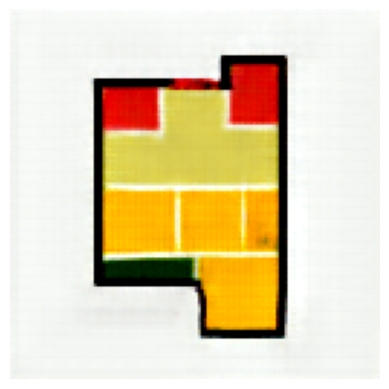

Saved image and description to /content/result.
Processing file: 43902.txt


It is right at the bottom of the living room connected to it only, it is around 20 feet wide and 5 feet in hight. It is at the right side of the front exit door connecting the living room, its 10 wide by 10 hight feet it is connected to the bedroom at the top left


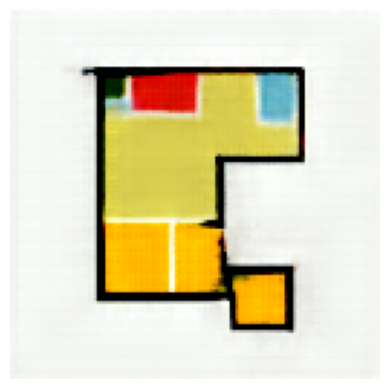

Saved image and description to /content/result.
Processing file: 66529.txt


The bathroom is located in north side of living room next to the common room2. size is 8*4 Common room 1 is located in the north east corner and near to the common room 2. size is 10*16 Common room 2 is located on the north side and between the bathroom and common


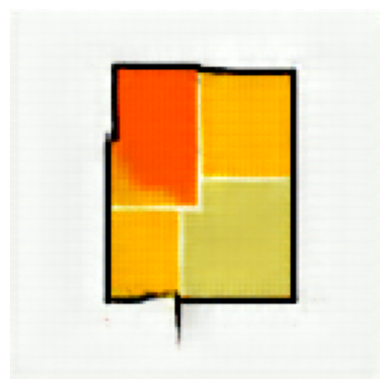

Saved image and description to /content/result.
Processing file: 6959.txt


Balcony Room on South East Corner with Living Room on Above , Total size of 5 Feet length and 3 Feet Width. Bath Room on north east corner with Living Room on Inside , Total size of 5 Feet length and 3 Feet Width. Com Room on North West Corner with kitchen Room on


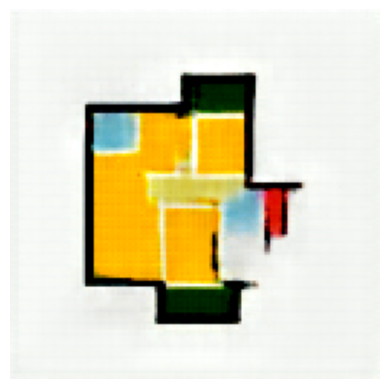

Saved image and description to /content/result.
Processing file: 71808.txt


The first balcony is in the north side of the apartment next to the living room. It is 20 ft x 5 ft. The second balcony is in the south side of the apartment next to the kitchen. It is 10 ft x 5 ft. The bathroom is in the west side of the apartment next to the livi


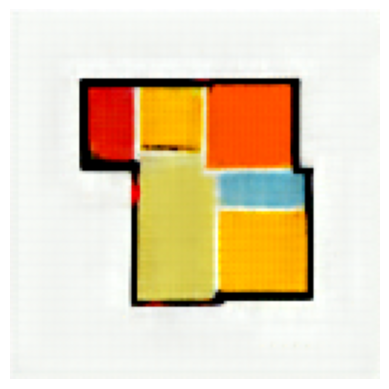

Saved image and description to /content/result.
Processing file: 63582.txt


The balcony is on the west side of the house. To the east is the master, and house exterior to the north, south, and west. It is about 3 feet wide by 13 feet long. The bath is on the south side of the house. To the north is the living room, to the west is the kitch


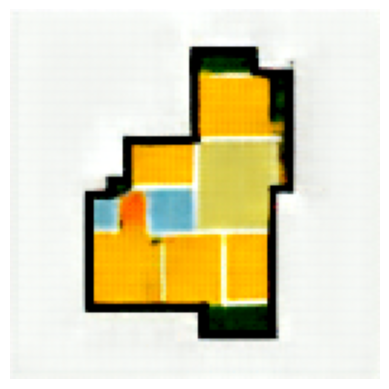

Saved image and description to /content/result.
Processing file: 71812.txt


It is  located in the north side, It is next to living   , The size of the room is   feet width 3 and 10   feet The bathroom is located on the north side, It is inside northeast corner of living , The size of the room is 4 feet width  and  6 feet length The common


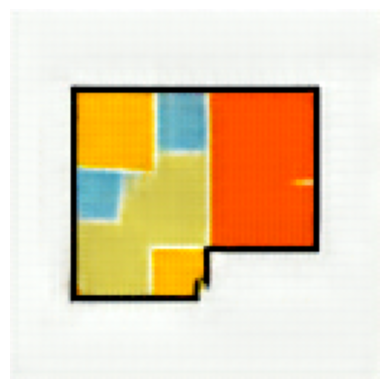

Saved image and description to /content/result.
Processing file: 67584.txt


Attached to the master bedrooms southern tip, you'll find the 12ft x 2 ft balcony that gives you easy access to get some fresh air quickly. Located in the north area of the house the bathroom is connected to bathroom and is in direct alignment with the bathroom. Li


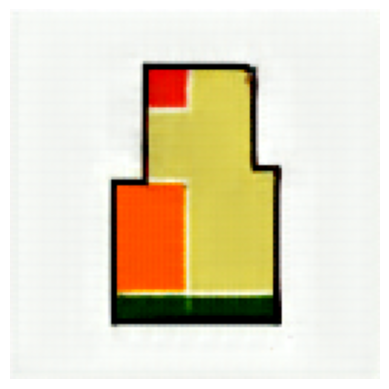

Saved image and description to /content/result.
Processing file: 28908.txt


Balcony 1 is located at the south eastern corner. It is south of the living room and east of the master room.  The dimensions are 15ft width by 4ft length. Balcony is located at the a corner of the eastern wall. It is eat of bathroom 2 and south of the kitchen. The


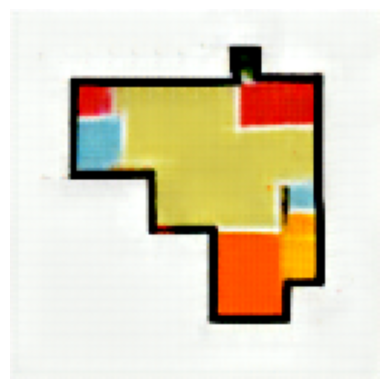

Saved image and description to /content/result.
Processing file: 38671.txt


The balcony is the southern most room on the floor plan. To its north is the living room. It's roughly 12ft by 6ft. Bathroom is central along the eastern wall of the floor plan. To its south is the master bedroom. It's roughly a 5ft by 5ft room. Common room 1 is in


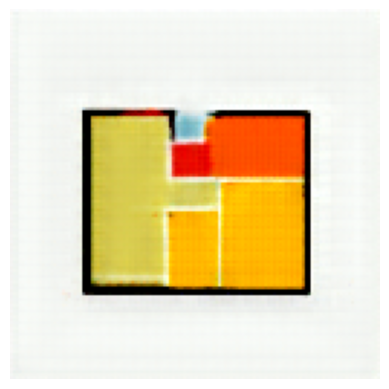

Saved image and description to /content/result.
Processing file: 231.txt


The bathroom is located in the east side, It is next to living and master, The size of the room is 4 feet width  and 5  feet length Common room 1 is located in the south , It is next to living and master , The size of the room is 10  feet width  and 10  feet length


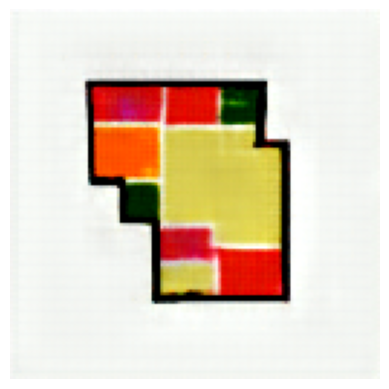

Saved image and description to /content/result.
Processing file: 75673.txt


The balcony is located in the south  side, It is  next to living room, The size of the room is 4 feet width  and 10  feet length The bathroom is located in the east side, It is next to living and kitchen, The size of the room is 4 feet width  and 5  feet length Com


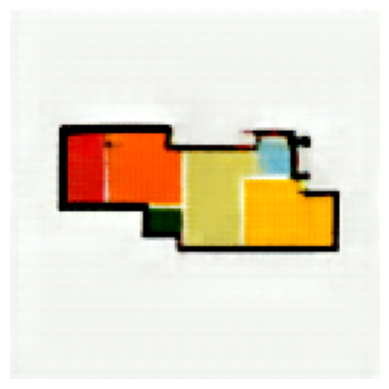

Saved image and description to /content/result.
Processing file: 62254.txt


Balcony 1 is located on the middle and bottom of the floor plan.   Its dimension is 10 feet by 6 ft.  Directly above it is common room 1 and to its right is balcony 2. Balcony 2 is located on the bottom right corner of the floor plan.   Its dimension is 10 feet by


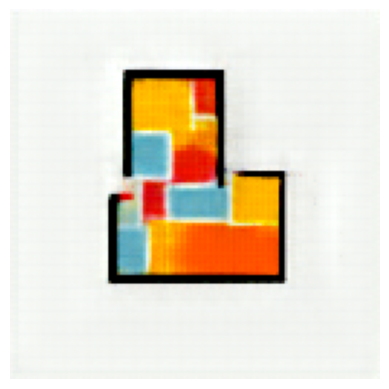

Saved image and description to /content/result.
Processing file: 26381.txt


Balcony 1 is on the west side of the house. To the east is the living room, and house exterior to the north, south, and west. It is about 5 feet wide by 15 feet long. Balcony 2 is on the north side of the house. To the east is the kitchen, to the south is the livin


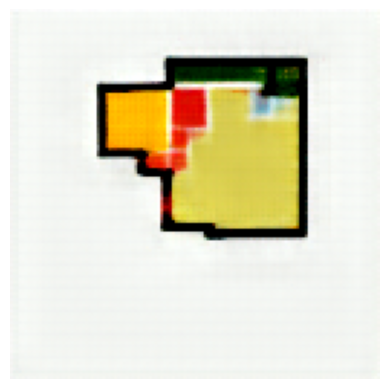

Saved image and description to /content/result.
Processing file: 70408.txt


The balcony is located on the southwestern and south central positions of the plan. The balcony touches the living room, common room 2, and master room and has a long rectangular shape. The balcony is approximately 150 square feet in size. The bathroom 1 is the sec


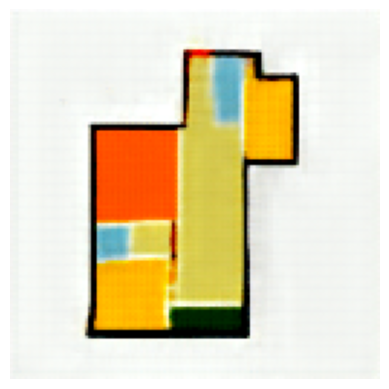

Saved image and description to /content/result.
Processing file: 78495.txt


balcony: The balcony is at the south side, spanning the master room which is to the north and is approximately 20 feet wide by 3 feet deep. bathroom: The bathroom is on the east side, with an exterior wall to the north, the living room to the west and the master ro


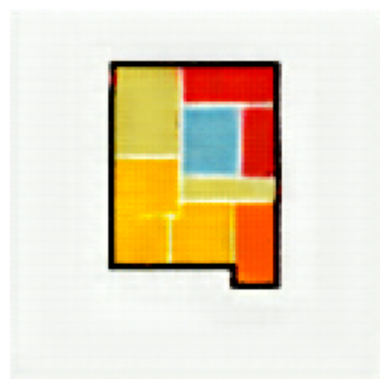

Saved image and description to /content/result.
Processing file: 73866.txt


Location:The absolute location of the balcony in the floor plan is south side.
Relationship:The absolute location of the balcony in the floor plan is en suite to living room.
Size:The area of the balcony in floor plan is 10 sq rt feet. Location:The absolute locatio


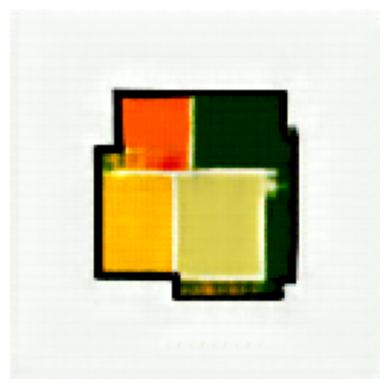

Saved image and description to /content/result.
Processing file: 18078.txt


Balcony 1 is west of the kitchen and south of the bathroom. It is approximately 8x10. Balcony 2 is east of the master bedroom. It is approximately 10x10. Balcony 3 is north of the living room and on the east side of the building. It is approximately 4x10. The bathr


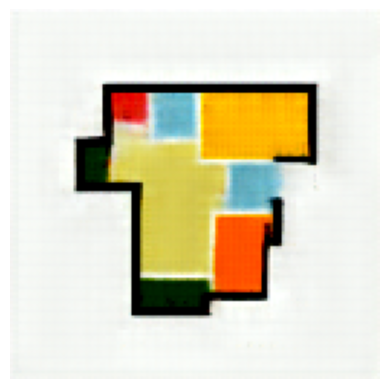

Saved image and description to /content/result.
Processing file: 39980.txt


The bathroom is located in the east side, It is next to living and between kitchen and master, The size of the room is 4 feet width  and 5  feet length The common room is located in the northeast corner, It is next to living room  , The size of the room is 10 feet


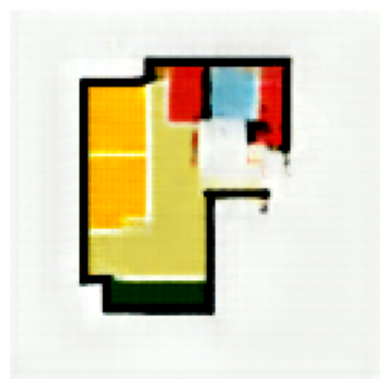

Saved image and description to /content/result.
Processing file: 5668.txt


Balcony is on the southern edge of the floor plan. To its north is the living room. It's roughly 12ft by 4ft Bathroom is on the Northern edge of the floor plan. To its south is the living room and to its west is the common room. It's 10ft by 6ft. Common room is in


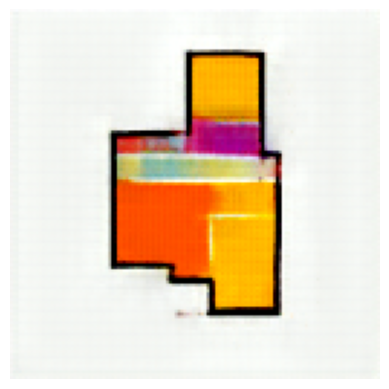

Saved image and description to /content/result.
Processing file: 19272.txt


The balcony is approximatly 15 feet in width and 3 feet in length and is located on the southmost western part of the floorplan. It is adjacent to the living room, which lies directly north of it. The bathroom is located in the northwest corner of the floorplan. It


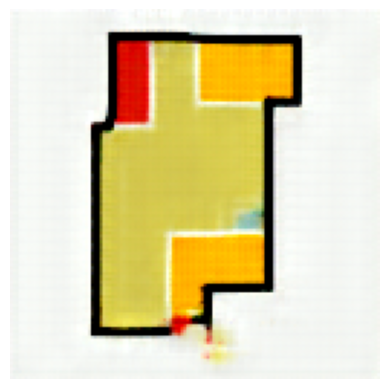

Saved image and description to /content/result.
Processing file: 23130.txt


Balcony 1 is immediately south of the master room, in line with its width, measuring approximately 10 feet by 2.5 feet. Balcony 2 is immediately north of the kitchen, in line with its width, measuring approximately 10 feet by 2.5 feet. Bathroom is directly west of


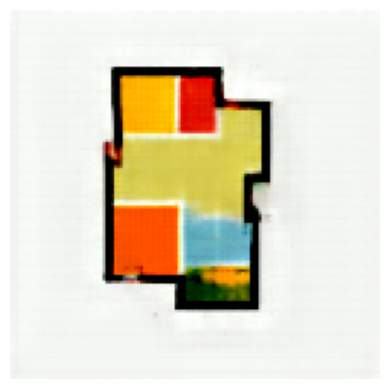

Saved image and description to /content/result.
Processing file: 46107.txt


Balcony1 is below the bathroom and on the west side of the building. It measures around 6 feet long and 10 feet wide. Balcony2 is the northern most room in the house and the living room is to the South. It measures 12 feet wide and 2 feet long. The bathroom is a 12


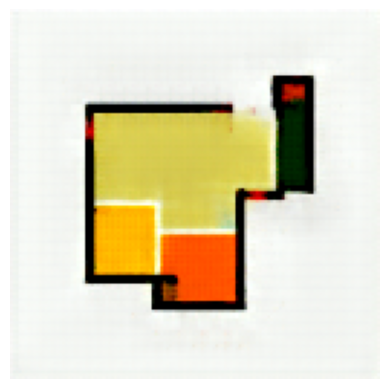

Saved image and description to /content/result.
Processing file: 44303.txt


The balcony is located in CORNER OF THE SOUTH AND EAST SIDE. THE BALCONY WITHIN LIVING ROOM. THE BALCONY ROOM SIZE IS 14 X 4 SQ FT. The bathroom is located in MIDDLE OF THE WEST SIDE. THE BATHROOM IN BETWEEN OF MASTER ROOM AND COMMON ROOM. THE BATHROOM SIZE IS 10 X


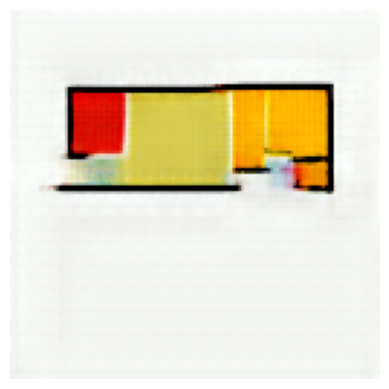

Saved image and description to /content/result.
Processing file: 20839.txt


balcony is located at south west corner. It is in front of the living room. It has the size of 4 feet width and 16 feet length. bathroom is located at north center side. It is situated in between the master and common room. It has the size of 5 feet width and 7 fee


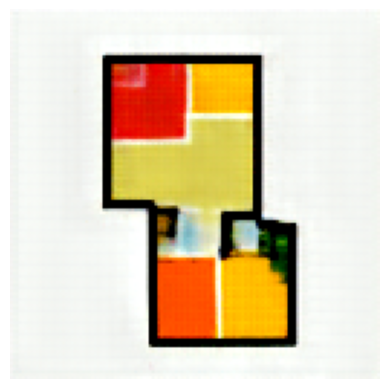

Saved image and description to /content/result.
Processing file: 42749.txt


Balcony 1 location:north west corner Relationship:the location: Between com2 and kitchen,  Area:30 sqrt feet   Sides: 10 feet width and 3 feet length.. Balcony 2 location:South side Relationship:the location: next to master,  Area:30 sqrt feet   Sides: 10 feet widt


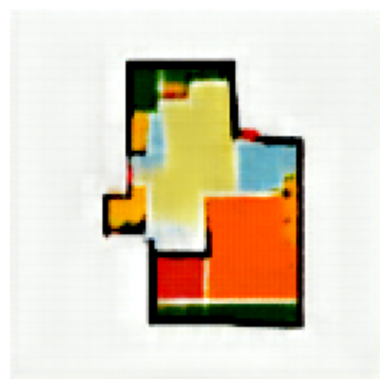

Saved image and description to /content/result.
Processing file: 28335.txt


Bathroom location:North Side, Relationship:the location: Between Com1 and Kitchen,  Area:50 sqrt feet   Sides: 10 feet width and 5 feet length.. Comon room 1 location:North West Corner, Relationship:the location: Next to Com3,  Area:150 sqrt feet   Sides: 10 feet w


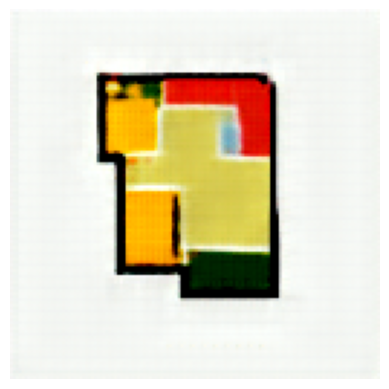

Saved image and description to /content/result.
Processing file: 26882.txt


balcony 1 is north west corner room it is entrance from living room  it is 10 feet length and 2 feet width . balcony 2is in front room as master room it is 1 feet length and 20 feet width.near room as master room . bathroom is entrance from living room near room as


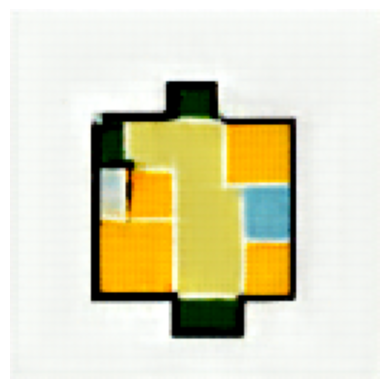

Saved image and description to /content/result.
Processing file: 25447.txt


Location: Balcony 1 is to the south of the floor plan.
Relationship: It is exactly to the south of the living room.
Size: It is about 4 feet by 18 feet. Location: Balcony 2 is to the North of the floor plan.
Relationship: The balcony_2 is exactly to the north of th


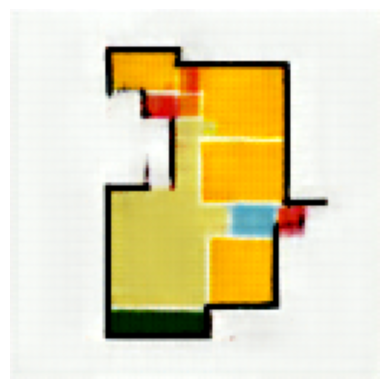

Saved image and description to /content/result.
Processing file: 66618.txt


located in the northwest corner, balcony 1 is about 8x4 and just off of the living area. Balcony 2 at 16x4 takes up much of the southern wall and is adjacent to the master on the east and living area to the north. Situated between the common room and master bed, th


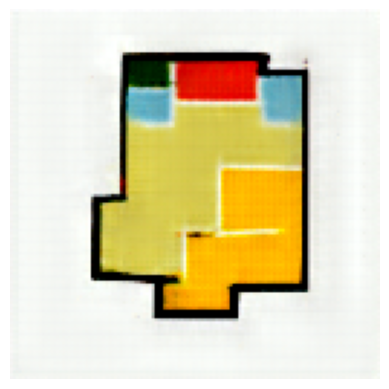

Saved image and description to /content/result.
Processing file: 53333.txt


balcony 1 is entrance from living room  10feet length and 2 feet width ratio as 3over1. balcony 2 is in front of kitchen   3 feet length and 8 feet width ratio as 3 over 1. bathroom is entrance from living room  3 feet length and 3 feet width master room and common


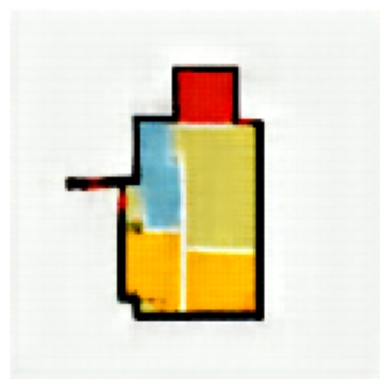

Saved image and description to /content/result.
Processing file: 32088.txt


Location: The balcony is on the far South of the floor plan.
Relationship: It on the immediate south of the master room.
Size: It is 2 feet by 14 feet. Location: The bathroom is to the west of the floor plan.
Relationship: It is to the North of the master room and


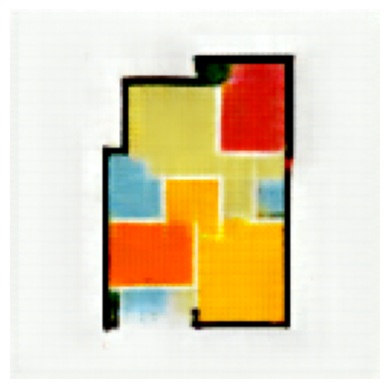

Saved image and description to /content/result.
Processing file: 5078.txt


The balcony is located on the southwest corner , It is next to master ,The size of the room is  2 feet width  and 10   feet length The bathroom is located on the west side, It is next to common and living , The size of the room is 5 feet width  and  5 feet length T


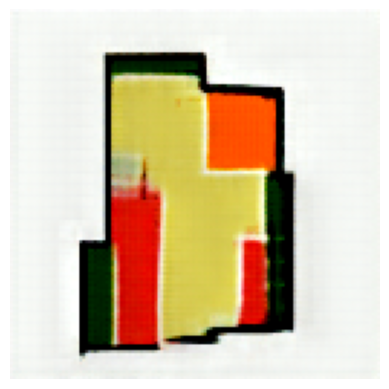

Saved image and description to /content/result.
Processing file: 33726.txt


Balcony 1 is  located in the north side, It is next to living   , The size of the room is   feet width 3 and 10   feet Balcony 2 is located in the southwest corner side, It is next to living   , The size of the room is  2 feet width  and 10   feet length The bathro


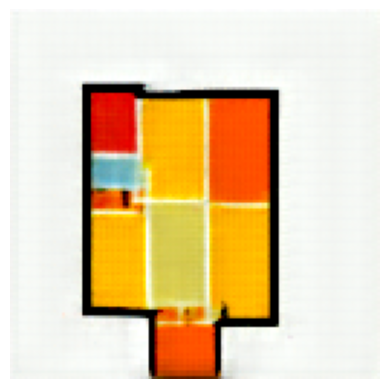

Saved image and description to /content/result.
Processing file: 44829.txt


bolcony at south east direction right side of living room size 12*6 feet bathroom 1 at north direction right side of common room 1 size  8*8 feet bathroom 2 at  north direction left side of  master room size 8*6 feet common room 1 at  west direction left side of ba


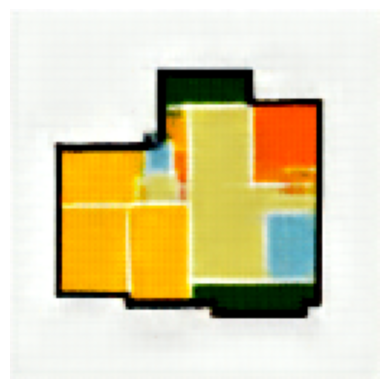

Saved image and description to /content/result.
Processing file: 75790.txt


The bathroom is on the south side of the house. To the north is the living room, to the east is the kitchen, and house exterior to the south and west. It is about 12 feet wide by 7 feet long. The common room is on the north side of the house. To the north and west


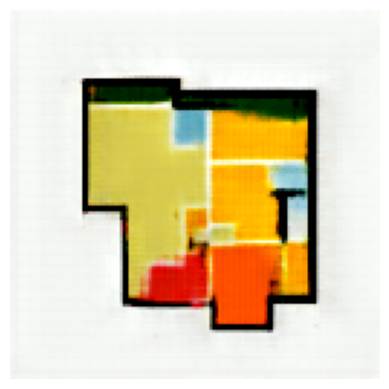

Saved image and description to /content/result.
Processing file: 47276.txt


Balcony 1 is located in the north east corner, It is next to bath and common1, The size of the room is 7  feet width  and 7  feet length Balcony 2 is located in the southwest corner side, It is next to living   , The size of the room is  2 feet width  and 10   feet


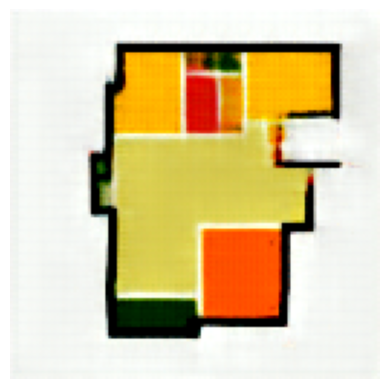

Saved image and description to /content/result.
Processing file: 5980.txt


The balcony is located on the southwest corner and next to the living. size is 16x5 The bathroom is located in the middle of east and between the master and com. size is 10x8 The common room is located in the northeast corner and near to the kitchen. size is 10x16


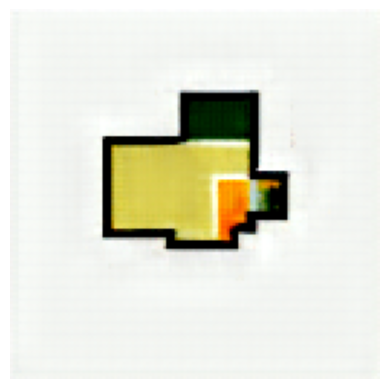

Saved image and description to /content/result.
Processing file: 59794.txt


balcony is located at north east corner and behind the master room. It has the size of 4 feet width and 12 feet length. bathroom  is located at west side and  in front of common room. It has the square size of 8 feet side. common room is located at  north west corn


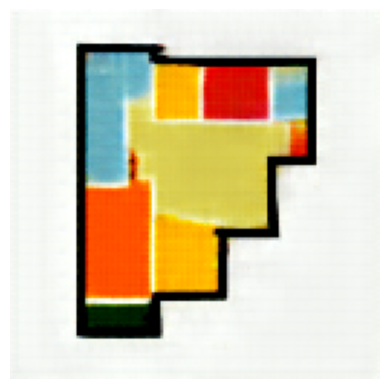

Saved image and description to /content/result.
Processing file: 26300.txt


The balcony is on the south side of the house. To the north is the master, and house exterior to the east, south, and west. It is about 14 feet wide by 4 feet long. The bathroom is on the north side of the house. To the north is house exterior, to the east is the l


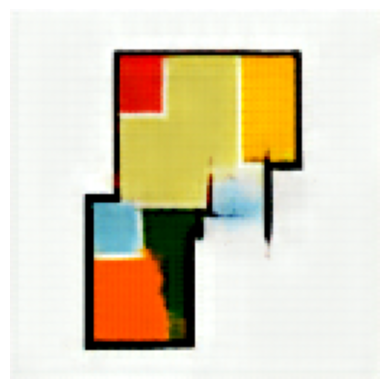

Saved image and description to /content/result.
Processing file: 39292.txt


Balcony  is entrance from living room .it is 15 feet length and 3 feet width aspect ratio as 5 over 1. Balcony 2 is entrance from living room .it is 2 feet length and 5 feet width aspect ratio as 1 over 2. Bathroom is entrance from living room .it is 5 feet length


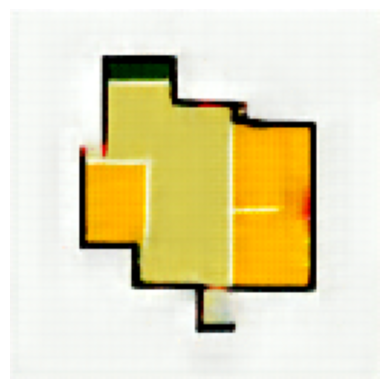

Saved image and description to /content/result.
Processing file: 51797.txt


The bathroom is at the West middle position. between common room 1 and master room. it is 10x 6 sq ft. Common room 1 is at the West and north corner position. Between bathroom and common room2. it is 10x10 sq ft. Common room 2 is at the North middle position. betwe


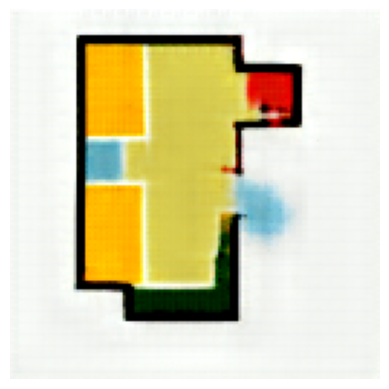

Saved image and description to /content/result.
Processing file: 26238.txt


The balcony1 is placed on the north west corner. The balcony  1 is situated in between the kitchen and the common room. The balcony 1 has a width of 6.5 feet and a length of 8.25 feet. The balcony 2 is placed on the south west corner. The balcony 2 is situated near


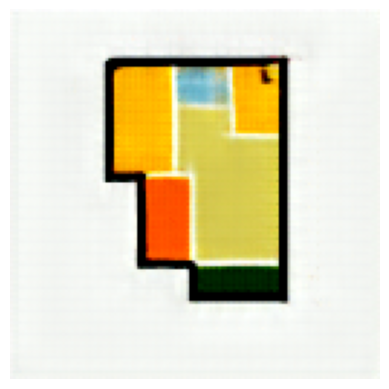

Saved image and description to /content/result.
Processing file: 14159.txt


The balcony is in the north-western corner of the apartment to the west of the kitchen, and north of common room 2. The size is roughly 5 by 5 square feet. The bathroom sits in the middle of the apartment, to the east of the common room 2, to the west of the living


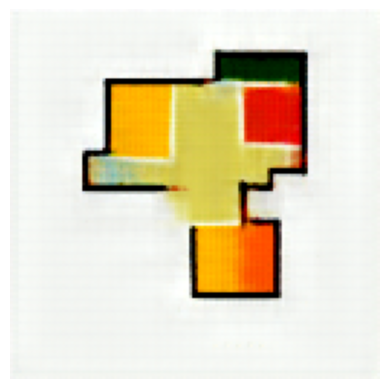

Saved image and description to /content/result.
Processing file: 43714.txt


Balcony 1 is located on the northwest corner and attach with com1. size is 4x15 Balcony 2 is located on the north side and next to living . size is 20x4 The bathroom is located in the southeast corner and near to the kitchen. size is 18x8 Common room 1 is located i


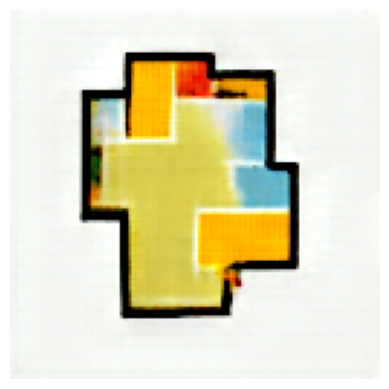

Saved image and description to /content/result.
Processing file: 78759.txt


The balcony is located in SOUTH AND WEST SIDE OF THE CORNER. NEAR TO LIVING ROOM. SIZE IS 14X6 SQ FT. The bathroom is located in MIDDLE OF THE EAST SIDE. IN BETWEEN OF THE KITCHEN ROOM AND COMMON ROOM 2. SIZE IS 10X8 SQ FT. Common room 1 is located in MIDDLE OF THE


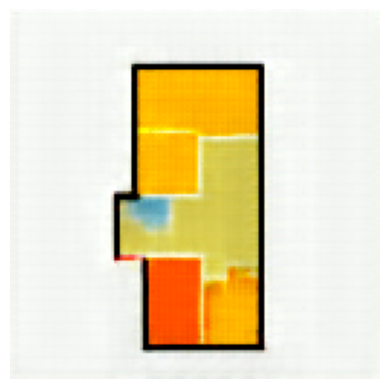

Saved image and description to /content/result.
Processing file: 1454.txt


Balcony 1 measures about 12x8ft, and is located on the east side of the of the living space. Balcony 2 is located off of the kitchen, on the northern end, and 2x5ft in size. The bathroom if located off of the living, next to the balcony, and is approximately 5x5ft.


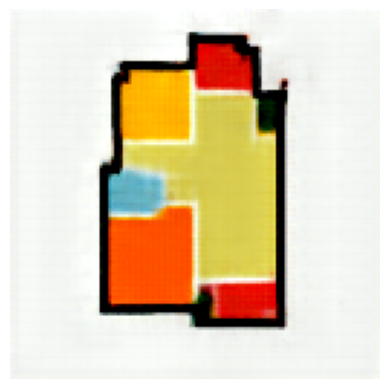

Saved image and description to /content/result.
Processing file: 5897.txt


Balcony 1 is at the north and west corner position. between master room and balcony2 . 10x6 sq ft. Balcony 2 is at the north and east corner position . between living room and balcony 1. it is 10x6 sq ft. The bathroom is at the east and south corner position . near


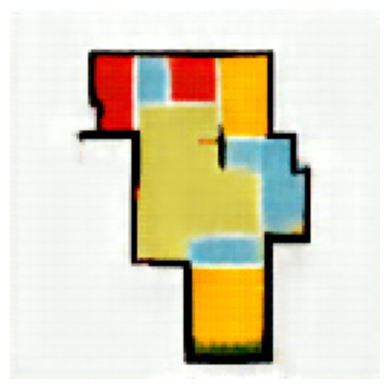

Saved image and description to /content/result.
Processing file: 49462.txt


balcony is toward south corner of the house adjacent to it is living room. it is 8 feet in length and 4 feet in width Towards the west of bathroom is a big living room. on upside(north) kitchen and below (south) master bedroom. On the entrance of the house towards


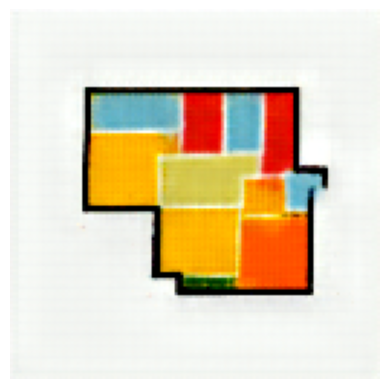

Saved image and description to /content/result.
Processing file: 16044.txt


The balcony is located in the top left corner of the floor plan.   Its dimension is 10 feet by 5 feet.  Directly below it is the master room. The bathroom is located in bottom right corner of the floor plan.  Its dimension is 14 feet by 8 feet.  Directly to its lef


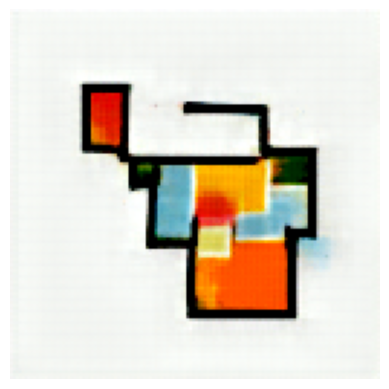

Saved image and description to /content/result.
Processing file: 3305.txt


It is in the square shape small room rear by kietchen it is situated in the north side of the plane and rectangle shape east west direction It is situated in the southwest side or the living room pathway It is in the square shape and it is in the mater room rear by


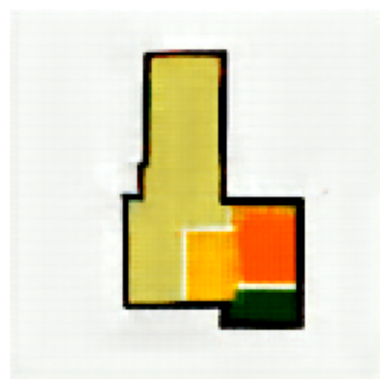

Saved image and description to /content/result.
Processing file: 43629.txt


balcony is located at south west corner and in front of master room. It has the size of 15 feet length and 5 feet width. bathroom is located at north west corner to master room and adjacent to living room.  It has the size of 10 feet length and 6 feet width. Common


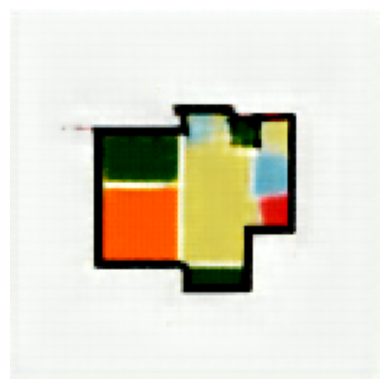

Saved image and description to /content/result.
Processing file: 7785.txt


Measuring about 12x4ft, balcony 1 is located on the south end of the living space. Balcony 2 is located on the northern end, next to the kitchen and is about 8x3ft in size. The bathroom is located directly across the living room from the main entrance, on the west,


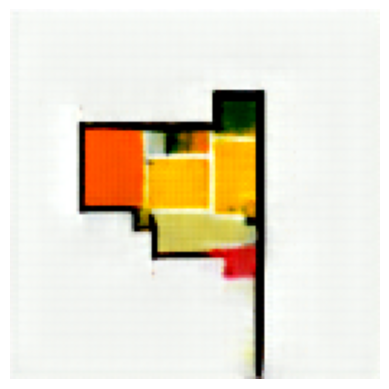

Saved image and description to /content/result.
Processing file: 19245.txt


The bathroom is on the north side in the middle, between common room 2 and the kitchen. It is about 5 feet across and 9 feet deep. Common room 1 is in the middle of the south side, with the living room to its east and the master to its west. It is across from the b


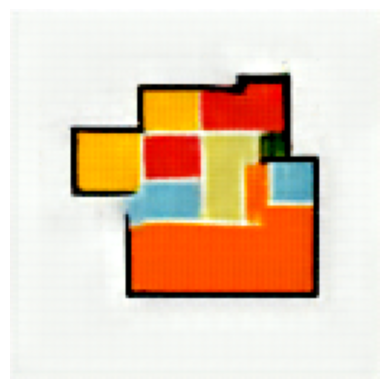

Saved image and description to /content/result.
Processing file: 38373.txt


balcony 1 is located at south east corner and below to the common 2. balcony 2 is located at western full, and near to living and master. bathroom 1 is located at north eastern corner and upper to the living room. bathroom 2 is located at south center and connected


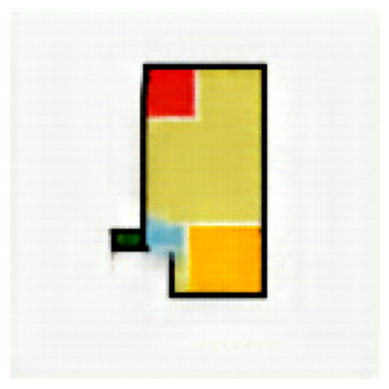

Saved image and description to /content/result.
Processing file: 58825.txt


The balcony is on the South West corner on the floor plan. It is next to the Living room. It is approximately 12feet length and 2 feet width The bathroom is in the centre of the floor plan. It is wedged between the Kitchen, Living and Master Rooms. It has an aspect


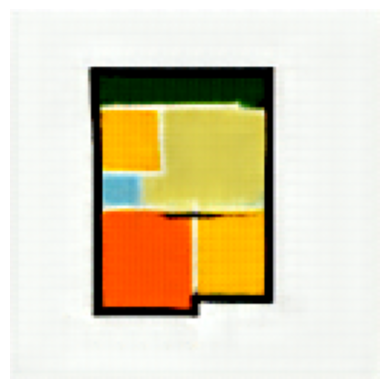

Saved image and description to /content/result.
Processing file: 29944.txt


Balcony 2 is located on the bottom left of the floor plan. It is next the living room, and below the kitchen. Its estimated size in width is 14 feet, and 20 feet in length. Balcony 2 is located on the top of the floor plan. It is above the master room. Its' estimat


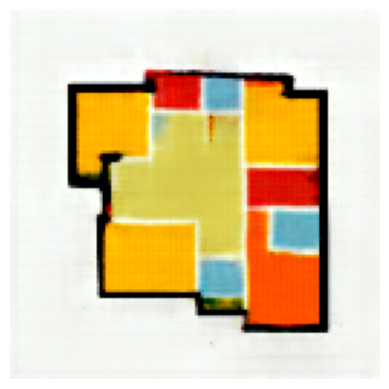

Saved image and description to /content/result.
Processing file: 65743.txt


balcony 1 is entrance from living room it is 2 feet length 10 feet width. balcony 2 is opposite side of balcony 1 .it is 1 feet length and 3 feet width. bathroom is the small room it is entrance from living room .it is 3 feet length and 2 feet width .master room an


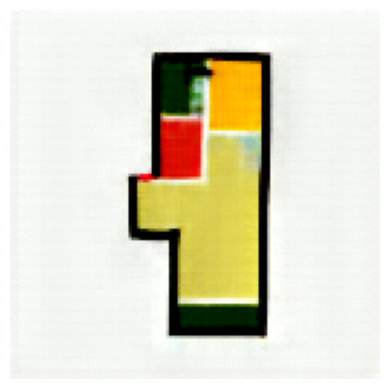

Saved image and description to /content/result.
Processing file: 69002.txt


The balcony is on the south side of the house. To the north is the common room, and house exterior to the east, south, and west. It is about 12 feet wide by 3 feet long. The bathroom is on the west side of the house. To the north is the living room hallway, to the


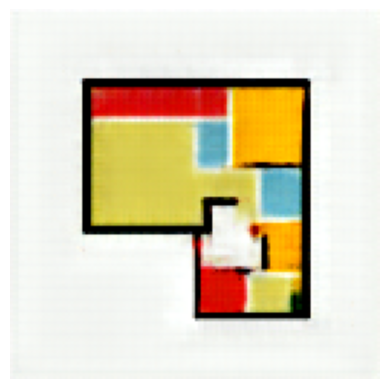

Saved image and description to /content/result.
Processing file: 14327.txt


balcony at  south direction downside of living room size 10*3 feet bathroom1 at  north direction upside of living size 8*4 feet bathroom2 at centre of plan image upside of master room size 6*6 feet common room1 at north west corner left sid of bathroom1 size 10*8 f


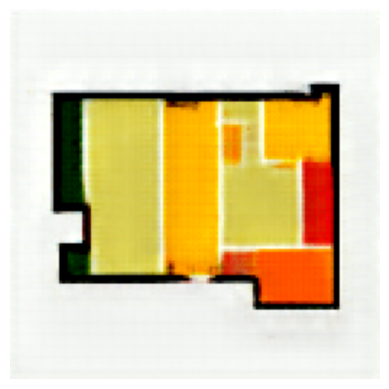

Saved image and description to /content/result.
Processing file: 50782.txt


balcony only is protruding and situated at south east corner and located in front of the master room towards south. It has the size of 13 feet length and 4.5 feet width. bath room is located at the center of the east side so that it is between the master room and k


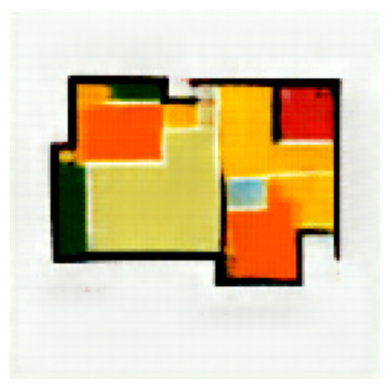

Saved image and description to /content/result.
Processing file: 61874.txt


Balcony is situated in south east of the house adjustment to living room. It is approximately 12X3 feet in size. Bathroom is situated in west side of the house adjustment to master bedroom. It is approximately 10X12 feet in size. Common room1 is situated in northwe


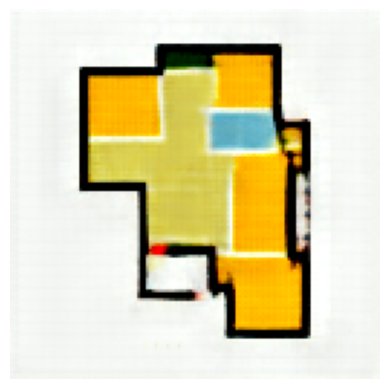

Saved image and description to /content/result.
Processing file: 51055.txt


The balconies on the north side of the apartment next to the living room and common room. It is approximately 3â x 25â The bathroom is on the west side of the apartment, between the master room and the common room. It's approximately 5â x 5â The common room


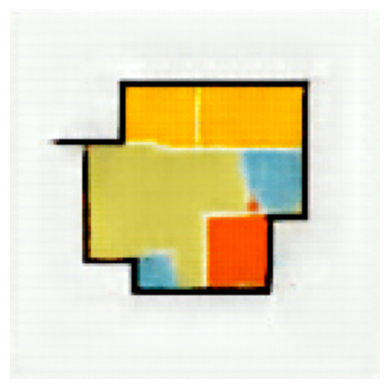

Saved image and description to /content/result.
Processing file: 75828.txt


The balcony is located on the southwest corner and near to kitchen and common2. size is 4*14 The bathroom is located in the west side and between the common1 and common2. size is 7*7 Common room 1 is located in the north west corner and near to bathroom and master


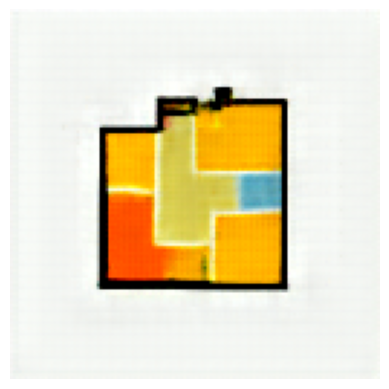

Saved image and description to /content/result.
Processing file: 192.txt


The balcony of the house in the bottom left corner of the house and is about 12 ft by 4 ft in size. The bathroom is in the top center of the house and is about 5 feet by 5 feet in size. The common room 1 is in the top right corner of the house and is about 12 ft by


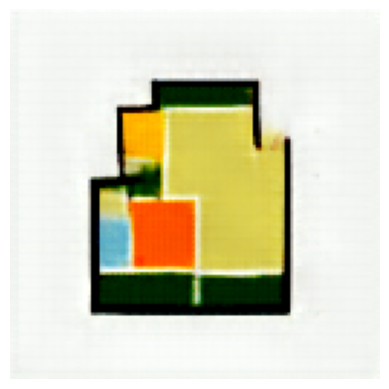

Saved image and description to /content/result.


In [ ]:
dataset_dir = "/content/test_dataset"
i=0

for file_name in os.listdir(dataset_dir):
  if file_name.endswith(".txt"):  # Process only .txt files
    file_path = os.path.join(dataset_dir, file_name)

    # Read the content of the text file
    with open(file_path, 'r') as file:
      content = file.read().strip()  # Read and remove leading/trailing whitespace

      # Pass the content to the generate_images function
      print(f"Processing file: {file_name}")
      generate_images(content,file_name.split(".")[0])

In [ ]:
import shutil

# Path to the folder to be zipped
folder_path = "/content/result"

# Path for the output zip file
zip_output_path = "/content/result.zip"

# Create the zip file
shutil.make_archive(zip_output_path.replace(".zip", ""), 'zip', folder_path)

print(f"Folder zipped successfully at {zip_output_path}")


Folder zipped successfully at /content/result.zip


In [ ]:
import os
import shutil
zip_file_path = "/content/result.zip"
destination_path = '/content/drive/My Drive/result.zip'
shutil.move(zip_file_path, destination_path)

'/content/drive/My Drive/result.zip'

In [ ]:
!pip install --upgrade opencv-python opencv-contrib-python

In [ ]:
import os
from PIL import Image, ImageEnhance

# Define your image enhancement function
def enhance_image_with_pil(image_path):
    try:
        # Open the image
        img = Image.open(image_path)

        # Example enhancement: Increase sharpness and brightness
        enhancer_sharpness = ImageEnhance.Sharpness(img)
        img = enhancer_sharpness.enhance(2.0)  # Sharpen the image

        enhancer_brightness = ImageEnhance.Brightness(img)
        img = enhancer_brightness.enhance(1.2)  # Increase brightness

        # Save the enhanced image back to the same path or a new one
        enhanced_path = image_path.replace(".png", "_enhanced.png")
        img.save(enhanced_path)
        print(f"Enhanced image saved at: {enhanced_path}")
    except Exception as e:
        print(f"Error enhancing image {image_path}: {e}")

# Folder containing the images
base_folder = "/content/result"

# Walk through all subfolders and files
for root, _, files in os.walk(base_folder):
    for file in files:
        if file.endswith((".png")):  # Filter image files
            image_path = os.path.join(root, file)
            enhance_image_with_pil(image_path)

Enhanced image saved at: /content/result/32088/32088_enhanced.png
Enhanced image saved at: /content/result/33726/33726_enhanced.png
Enhanced image saved at: /content/result/6959/6959_enhanced.png
Enhanced image saved at: /content/result/66529/66529_enhanced.png
Enhanced image saved at: /content/result/73866/73866_enhanced.png
Enhanced image saved at: /content/result/23130/23130_enhanced.png
Enhanced image saved at: /content/result/71192/71192_enhanced.png
Enhanced image saved at: /content/result/69002/69002_enhanced.png
Enhanced image saved at: /content/result/56692/56692_enhanced.png
Enhanced image saved at: /content/result/58825/58825_enhanced.png
Enhanced image saved at: /content/result/35066/35066_enhanced.png
Enhanced image saved at: /content/result/70408/70408_enhanced.png
Enhanced image saved at: /content/result/20839/20839_enhanced.png
Enhanced image saved at: /content/result/51055/51055_enhanced.png
Enhanced image saved at: /content/result/75828/75828_enhanced.png
Enhanced ima

In [ ]:
import shutil

# Path to the folder to be zipped
folder_path = "/content/result"

# Path for the output zip file
zip_output_path = "/content/result_enhanced.zip"

# Create the zip file
shutil.make_archive(zip_output_path.replace(".zip", ""), 'zip', folder_path)

print(f"Folder zipped successfully at {zip_output_path}")

Folder zipped successfully at /content/result_enhanced.zip


In [ ]:
import os
import shutil
zip_file_path = "/content/result_enhanced.zip"
destination_path = '/content/drive/My Drive/result_enhanced.zip'
shutil.move(zip_file_path, destination_path)

'/content/drive/My Drive/result_enhanced.zip'

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

def enhance_image_with_pil(image_path):
    """
    Enhance the quality of an image using PIL with edge enhancement and sharpening.

    Parameters:
        image_path (str): The path to the input image.

    Returns:
        None: Displays the enhanced image.
    """
    # Load the image
    image = Image.open(image_path)

    # Apply edge enhancement
    edge_enhanced_image = image.filter(ImageFilter.EDGE_ENHANCE)

    # Apply sharpening
    sharpened_image = edge_enhanced_image.filter(ImageFilter.SHARPEN)

    # Display the original and enhanced images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(sharpened_image)
    plt.title("Enhanced Image")
    plt.axis("off")

    plt.show()

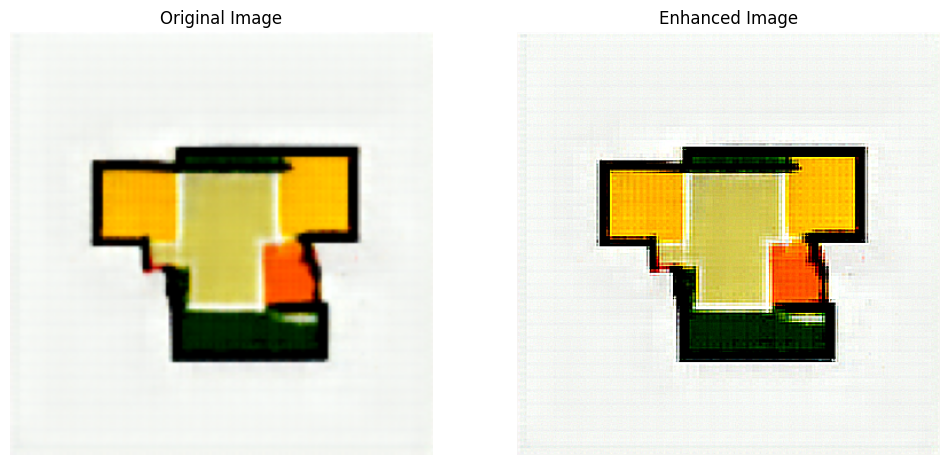

In [ ]:
image_path = "/content/result/1522/1522.png"
enhance_image_with_pil(image_path)